In [24]:
import tensorflow as tf
import numpy as np
from numpy import zeros , ones , expand_dims
from numpy.random import randn , randint
import matplotlib.pyplot as plt
from tensorflow import keras
from keras import layers
from keras import initializers
from keras.layers import Dense
from keras.layers import Input
from keras.layers import Reshape , Activation
from keras.layers import Flatten , LeakyReLU , Dropout
from keras.datasets import cifar10
from keras.optimizers import Adam , RMSprop , SGD
from keras.models import Model
from IPython.display import clear_output
import platform
platform.python_version()

'3.6.9'

In [25]:
#Load data
(X_train,_) , (_, _) = cifar10.load_data()
#Normalizing to [-1,1]
X_train = X_train.astype(np.float32)/127.5-1 
#X_train = np.expand_dims(X_train , axis=4)
print(X_train.shape)

(50000, 32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

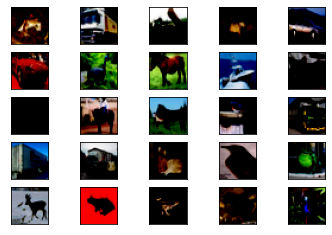

In [26]:
for i in range(25):
  plt.subplot(5,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  y=X_train[i]
  plt.imshow(y)
plt.show()

In [27]:
#Define Discriminator
def define_discriminator(in_shape=(32,32,3)):
#Initializing Weight
  init =  keras.initializers.RandomNormal(stddev=0.02)
  in_image = Input(shape=in_shape) # 32*32*3 = 3072
  fe = Flatten()(in_image)

  #1024
  fe = Dense(1024)(fe)
  fe = LeakyReLU(alpha = 0.2)(fe)
  fe = Dropout(0.3)(fe)

  #512
  fe = Dense(512)(fe)
  fe = LeakyReLU(alpha=0.2)(fe)
  fe = Dropout(0.3)(fe)

  #256
  fe = Dense(256)(fe)
  fe = LeakyReLU(alpha=0.2)(fe)
  fe = Dropout(0.3)(fe)

  #Output real/fake
  out = Dense(1 , activation = 'sigmoid')(fe)
  #Defining Model
  model = Model(in_image , out)
  #Compiling 
  opt = Adam(lr = 0.0002 , beta_1=0.5)
  model.compile(loss = 'binary_crossentropy' , optimizer = opt , metrics=['accuracy'])
  return model



In [28]:
discriminator = define_discriminator()
discriminator.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 32, 32, 3)         0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 3072)              0         
_________________________________________________________________
dense_9 (Dense)              (None, 1024)              3146752   
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 1024)              0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_10 (Dense)             (None, 512)               524800    
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 512)               0   

In [29]:
#Defining Generator
def define_generator(latent_dim):
  #Initializing Weights
  in_lat = Input(shape=(latent_dim , )) #input to the generator

  #256
  gen = Dense(256 , kernel_initializer=initializers.RandomNormal(stddev=0.02))(in_lat)
  gen = LeakyReLU(alpha=0.2)(gen)

  #512
  gen = Dense(512 , kernel_initializer=initializers.RandomNormal(stddev=0.02))(gen)
  gen = LeakyReLU(alpha=0.2)(gen)

  #1024
  gen = Dense(1024 , kernel_initializer=initializers.RandomNormal(stddev=0.02))(gen)
  gen = LeakyReLU(alpha=0.2)(gen) 

  #32*32*3
  gen = Dense(32*32*3 , kernel_initializer=initializers.RandomNormal(stddev=0.02))(gen)
  out_layer = Activation('tanh')(gen)
  out_layer = Reshape((32,32,3))(out_layer)

  #defining model
  model = Model(in_lat , out_layer)
  return model

In [30]:
generator = define_generator(100)
generator.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 100)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 256)               25856     
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 256)               0         
_________________________________________________________________
dense_14 (Dense)             (None, 512)               131584    
_________________________________________________________________
leaky_re_lu_11 (LeakyReLU)   (None, 512)               0         
_________________________________________________________________
dense_15 (Dense)             (None, 1024)              525312    
_________________________________________________________________
leaky_re_lu_12 (LeakyReLU)   (None, 1024)              0   

In [31]:
#Defining GAN model for updating generator
def define_gan(g_model , d_model):
  #Freeze the Discriminator
  d_model.trainable = False
  #Connecting Generator output to Discriminator
  gan_output = d_model(g_model.output)
  #Defining GAN model
  model = Model(g_model.input , gan_output)
  #Compile model
  opt = Adam(lr=0.0002 , beta_1=0.5)
  model.compile(loss='binary_crossentropy' , optimizer=opt , metrics=['accuracy'])
  return model

In [32]:
gan_model = define_gan(generator , discriminator)

In [33]:
#Selecting Real samples
def generate_real_samples(X_train , n_samples):
  #Selecting Random Instances
  ix = randint(0 , X_train.shape[0] , n_samples)
  #Selecting Images and labels
  X = X_train[ix]
  #labeling as real
  y = ones((n_samples , 1))
  return X,y

In [34]:
# generate input to the generator(latent points)
def generate_latent_points(latent_dim , n_samples):
  #generating latent space points
  x_input = randn(latent_dim * n_samples)
  #reshape the input
  z_input = x_input.reshape(n_samples , latent_dim)
  return z_input

In [35]:
#generating fake examples
def generate_fake_samples(generator , latent_dim , n_samples):
  #generating latent space points
  z_input = generate_latent_points(latent_dim , n_samples)
  #predict
  images = generator.predict(z_input)
  #creating labels for fake samples
  y = zeros((n_samples , 1))
  return images , y

In [52]:
def summarize_performance(step , g_model , latent_dim , n_samples=100):
  #prepare fake samples
  X,_ = generate_fake_samples(g_model , latent_dim , n_samples)
  #scale from [-1,1] to [0,1]
  X = (X+1)/2.0
  #plot generated images
  for i in range(n_samples):
    plt.subplot(10,10,i+1)
    plt.axis('off')
    plt.imshow(X[i])
  plt.show()
  image_gen = 'model_%04d.h5' % (step+1)
  g_model.save(image_gen)
  print('>saved: %s' % (image_gen))

  

In [57]:
#training generator and discriminator
def train(g_model , d_model , gan_model , X_train , latent_dim , n_epochs , n_batch):
  #defining batch per epoch
  bat_per_epo = int(X_train.shape[0] / n_batch)
  #calculate the number of training iterations
  n_steps = bat_per_epo * n_epochs
  
  for i in range(n_steps):
    #get randomly selected real samples
    X_real , y_real = generate_real_samples(X_train , n_batch)
    #update weights of discriminator
    d_loss_r  , d_acc_r = d_model.train_on_batch(X_real , y_real)
    #generate fake samples
    X_fake , y_fake = generate_fake_samples(g_model , latent_dim , n_batch)
    #update discriminator model weights
    d_loss_f , d_acc_f = d_model.train_on_batch(X_fake , y_fake)
    #prepare points in latent space
    z_input = generate_latent_points(latent_dim , n_batch)
    #create inverted labels for the fake samples
    y_gan = ones((n_batch , 1))
    #update generator weights via discriminator error
    g_loss , g_acc = gan_model.train_on_batch(z_input , y_gan)
    #summarize loss on this batch
    print('>%d, dr[%.3f,%.3f], df[%.3f,%.3f], g[%.3f,%.3f]' % (i+1, d_loss_r,d_acc_r,d_loss_f,d_acc_f,g_loss,g_acc))
    #evaluate model performance on every epoch
    if(i+1) % (bat_per_epo*1) ==0:
      summarize_performance(i, g_model, latent_dim)

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>1, dr[0.713,0.422], df[0.666,0.734], g[0.770,0.297]
>2, dr[0.701,0.422], df[0.694,0.609], g[0.750,0.359]
>3, dr[0.693,0.531], df[0.699,0.609], g[0.747,0.297]
>4, dr[0.713,0.375], df[0.670,0.625], g[0.753,0.328]
>5, dr[0.668,0.609], df[0.725,0.531], g[0.746,0.359]
>6, dr[0.640,0.641], df[0.653,0.688], g[0.751,0.344]
>7, dr[0.674,0.500], df[0.663,0.672], g[0.744,0.391]
>8, dr[0.677,0.516], df[0.697,0.531], g[0.716,0.469]
>9, dr[0.692,0.469], df[0.708,0.531], g[0.757,0.281]
>10, dr[0.661,0.531], df[0.743,0.500], g[0.739,0.359]
>11, dr[0.673,0.531], df[0.676,0.625], g[0.715,0.391]
>12, dr[0.665,0.547], df[0.723,0.469], g[0.752,0.406]
>13, dr[0.720,0.391], df[0.688,0.609], g[0.744,0.312]
>14, dr[0.679,0.484], df[0.681,0.672], g[0.742,0.391]
>15, dr[0.702,0.453], df[0.673,0.625], g[0.725,0.406]
>16, dr[0.699,0.438], df[0.670,0.688], g[0.781,0.266]
>17, dr[0.716,0.438], df[0.691,0.609], g[0.704,0.406]
>18, dr[0.717,0.406], df[0.685,0.594], g[0.772,0.281]
>19, dr[0.677,0.547], df[0.691,0.547]

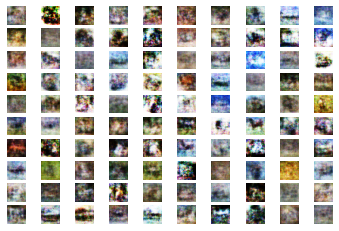

>saved: model_0781.h5
>782, dr[0.704,0.516], df[0.685,0.578], g[0.769,0.391]
>783, dr[0.721,0.422], df[0.614,0.734], g[0.782,0.328]
>784, dr[0.677,0.578], df[0.670,0.547], g[0.752,0.406]
>785, dr[0.698,0.484], df[0.679,0.625], g[0.736,0.406]
>786, dr[0.695,0.469], df[0.655,0.641], g[0.728,0.422]
>787, dr[0.660,0.547], df[0.673,0.672], g[0.742,0.375]
>788, dr[0.690,0.516], df[0.684,0.562], g[0.715,0.391]
>789, dr[0.715,0.453], df[0.728,0.500], g[0.744,0.406]
>790, dr[0.662,0.516], df[0.685,0.547], g[0.744,0.391]
>791, dr[0.701,0.453], df[0.665,0.594], g[0.737,0.422]
>792, dr[0.723,0.469], df[0.680,0.578], g[0.693,0.516]
>793, dr[0.698,0.484], df[0.742,0.391], g[0.738,0.422]
>794, dr[0.691,0.500], df[0.725,0.531], g[0.757,0.359]
>795, dr[0.701,0.516], df[0.712,0.469], g[0.746,0.359]
>796, dr[0.730,0.359], df[0.690,0.578], g[0.756,0.359]
>797, dr[0.708,0.344], df[0.666,0.594], g[0.707,0.438]
>798, dr[0.684,0.516], df[0.674,0.594], g[0.737,0.406]
>799, dr[0.700,0.562], df[0.675,0.609], g[0

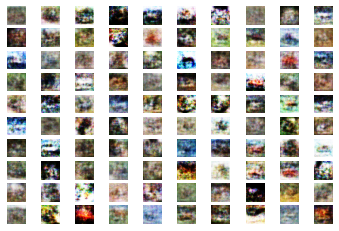

>saved: model_1562.h5
>1563, dr[0.710,0.500], df[0.718,0.625], g[0.737,0.391]
>1564, dr[0.719,0.438], df[0.694,0.594], g[0.735,0.375]
>1565, dr[0.683,0.469], df[0.713,0.547], g[0.758,0.375]
>1566, dr[0.702,0.531], df[0.702,0.594], g[0.752,0.359]
>1567, dr[0.718,0.422], df[0.657,0.703], g[0.697,0.453]
>1568, dr[0.677,0.500], df[0.672,0.672], g[0.756,0.344]
>1569, dr[0.718,0.375], df[0.688,0.719], g[0.746,0.391]
>1570, dr[0.728,0.406], df[0.665,0.656], g[0.752,0.375]
>1571, dr[0.689,0.500], df[0.686,0.609], g[0.791,0.297]
>1572, dr[0.653,0.641], df[0.700,0.562], g[0.732,0.344]
>1573, dr[0.712,0.453], df[0.667,0.688], g[0.723,0.375]
>1574, dr[0.716,0.375], df[0.670,0.609], g[0.755,0.328]
>1575, dr[0.685,0.531], df[0.694,0.547], g[0.724,0.422]
>1576, dr[0.687,0.469], df[0.680,0.641], g[0.766,0.297]
>1577, dr[0.728,0.484], df[0.703,0.531], g[0.720,0.438]
>1578, dr[0.703,0.469], df[0.661,0.578], g[0.743,0.344]
>1579, dr[0.687,0.422], df[0.674,0.594], g[0.735,0.359]
>1580, dr[0.718,0.406], df

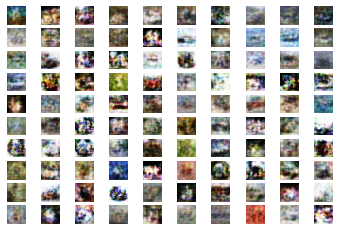

>saved: model_2343.h5
>2344, dr[0.694,0.422], df[0.681,0.547], g[0.712,0.422]
>2345, dr[0.687,0.453], df[0.689,0.531], g[0.728,0.500]
>2346, dr[0.685,0.531], df[0.711,0.500], g[0.742,0.375]
>2347, dr[0.672,0.500], df[0.698,0.578], g[0.772,0.375]
>2348, dr[0.703,0.484], df[0.718,0.562], g[0.711,0.422]
>2349, dr[0.683,0.500], df[0.710,0.516], g[0.753,0.328]
>2350, dr[0.663,0.562], df[0.686,0.594], g[0.726,0.328]
>2351, dr[0.682,0.516], df[0.710,0.516], g[0.754,0.328]
>2352, dr[0.684,0.453], df[0.667,0.656], g[0.758,0.328]
>2353, dr[0.710,0.516], df[0.692,0.547], g[0.702,0.500]
>2354, dr[0.690,0.547], df[0.711,0.484], g[0.730,0.453]
>2355, dr[0.650,0.516], df[0.731,0.422], g[0.734,0.406]
>2356, dr[0.668,0.578], df[0.717,0.562], g[0.714,0.438]
>2357, dr[0.678,0.562], df[0.697,0.516], g[0.725,0.344]
>2358, dr[0.684,0.500], df[0.679,0.609], g[0.699,0.438]
>2359, dr[0.675,0.531], df[0.698,0.578], g[0.734,0.422]
>2360, dr[0.680,0.531], df[0.712,0.531], g[0.716,0.484]
>2361, dr[0.701,0.469], df

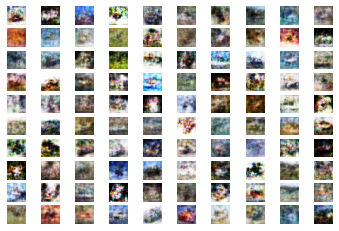

>saved: model_3124.h5
>3125, dr[0.723,0.391], df[0.707,0.531], g[0.752,0.344]
>3126, dr[0.673,0.531], df[0.690,0.625], g[0.748,0.344]
>3127, dr[0.712,0.484], df[0.665,0.688], g[0.731,0.469]
>3128, dr[0.735,0.359], df[0.671,0.578], g[0.758,0.312]
>3129, dr[0.708,0.484], df[0.694,0.625], g[0.752,0.375]
>3130, dr[0.686,0.500], df[0.667,0.656], g[0.735,0.344]
>3131, dr[0.700,0.453], df[0.676,0.719], g[0.768,0.328]
>3132, dr[0.695,0.516], df[0.690,0.547], g[0.707,0.484]
>3133, dr[0.666,0.547], df[0.682,0.484], g[0.708,0.406]
>3134, dr[0.715,0.375], df[0.696,0.609], g[0.748,0.312]
>3135, dr[0.722,0.359], df[0.674,0.562], g[0.747,0.312]
>3136, dr[0.716,0.453], df[0.675,0.609], g[0.740,0.328]
>3137, dr[0.660,0.531], df[0.718,0.531], g[0.759,0.297]
>3138, dr[0.715,0.422], df[0.659,0.703], g[0.731,0.375]
>3139, dr[0.679,0.500], df[0.705,0.562], g[0.713,0.359]
>3140, dr[0.683,0.531], df[0.701,0.578], g[0.724,0.359]
>3141, dr[0.700,0.500], df[0.681,0.688], g[0.745,0.344]
>3142, dr[0.682,0.500], df

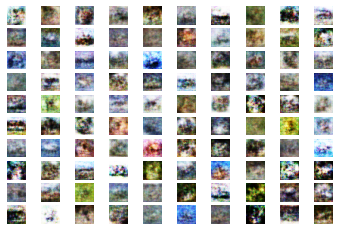

>saved: model_3905.h5
>3906, dr[0.703,0.453], df[0.718,0.484], g[0.723,0.391]
>3907, dr[0.691,0.469], df[0.688,0.578], g[0.705,0.500]
>3908, dr[0.709,0.422], df[0.714,0.516], g[0.720,0.406]
>3909, dr[0.667,0.594], df[0.719,0.469], g[0.701,0.484]
>3910, dr[0.684,0.609], df[0.721,0.516], g[0.745,0.297]
>3911, dr[0.670,0.609], df[0.691,0.578], g[0.707,0.422]
>3912, dr[0.712,0.453], df[0.718,0.453], g[0.734,0.453]
>3913, dr[0.681,0.500], df[0.719,0.516], g[0.709,0.422]
>3914, dr[0.714,0.500], df[0.683,0.594], g[0.734,0.375]
>3915, dr[0.701,0.469], df[0.692,0.594], g[0.736,0.438]
>3916, dr[0.716,0.500], df[0.710,0.531], g[0.724,0.375]
>3917, dr[0.689,0.500], df[0.719,0.516], g[0.714,0.453]
>3918, dr[0.705,0.375], df[0.681,0.625], g[0.751,0.359]
>3919, dr[0.690,0.547], df[0.656,0.625], g[0.733,0.344]
>3920, dr[0.685,0.547], df[0.694,0.562], g[0.737,0.391]
>3921, dr[0.705,0.484], df[0.682,0.516], g[0.732,0.328]
>3922, dr[0.687,0.469], df[0.685,0.594], g[0.742,0.391]
>3923, dr[0.753,0.297], df

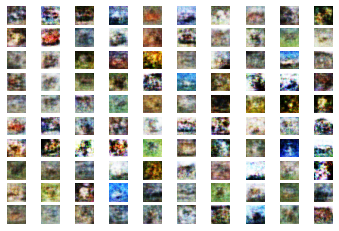

>saved: model_4686.h5
>4687, dr[0.693,0.469], df[0.706,0.469], g[0.738,0.406]
>4688, dr[0.688,0.578], df[0.650,0.672], g[0.719,0.359]
>4689, dr[0.663,0.578], df[0.703,0.562], g[0.747,0.375]
>4690, dr[0.692,0.531], df[0.731,0.516], g[0.701,0.438]
>4691, dr[0.678,0.562], df[0.690,0.641], g[0.737,0.391]
>4692, dr[0.670,0.516], df[0.752,0.484], g[0.685,0.500]
>4693, dr[0.669,0.547], df[0.748,0.562], g[0.730,0.344]
>4694, dr[0.672,0.578], df[0.680,0.719], g[0.717,0.391]
>4695, dr[0.660,0.625], df[0.673,0.578], g[0.722,0.453]
>4696, dr[0.696,0.562], df[0.696,0.500], g[0.726,0.422]
>4697, dr[0.704,0.500], df[0.702,0.484], g[0.720,0.484]
>4698, dr[0.707,0.422], df[0.683,0.609], g[0.737,0.438]
>4699, dr[0.680,0.516], df[0.702,0.516], g[0.755,0.375]
>4700, dr[0.701,0.531], df[0.718,0.516], g[0.748,0.344]
>4701, dr[0.686,0.500], df[0.683,0.594], g[0.756,0.312]
>4702, dr[0.696,0.516], df[0.713,0.484], g[0.769,0.312]
>4703, dr[0.709,0.500], df[0.741,0.531], g[0.729,0.391]
>4704, dr[0.706,0.516], df

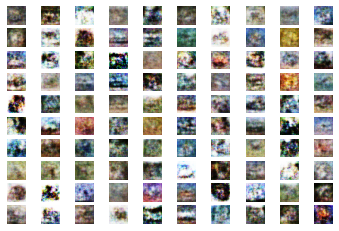

>saved: model_5467.h5
>5468, dr[0.675,0.578], df[0.667,0.703], g[0.725,0.469]
>5469, dr[0.694,0.484], df[0.711,0.484], g[0.738,0.391]
>5470, dr[0.683,0.531], df[0.721,0.500], g[0.732,0.422]
>5471, dr[0.693,0.516], df[0.684,0.547], g[0.743,0.391]
>5472, dr[0.679,0.500], df[0.692,0.547], g[0.758,0.344]
>5473, dr[0.715,0.422], df[0.712,0.547], g[0.735,0.406]
>5474, dr[0.690,0.531], df[0.682,0.625], g[0.706,0.516]
>5475, dr[0.708,0.422], df[0.682,0.609], g[0.713,0.438]
>5476, dr[0.719,0.359], df[0.717,0.469], g[0.725,0.453]
>5477, dr[0.727,0.359], df[0.693,0.516], g[0.729,0.375]
>5478, dr[0.702,0.500], df[0.695,0.562], g[0.763,0.328]
>5479, dr[0.715,0.422], df[0.670,0.656], g[0.746,0.266]
>5480, dr[0.718,0.375], df[0.679,0.578], g[0.750,0.344]
>5481, dr[0.708,0.484], df[0.679,0.625], g[0.741,0.328]
>5482, dr[0.711,0.391], df[0.686,0.547], g[0.740,0.312]
>5483, dr[0.692,0.453], df[0.680,0.672], g[0.755,0.297]
>5484, dr[0.713,0.391], df[0.700,0.562], g[0.727,0.375]
>5485, dr[0.725,0.500], df

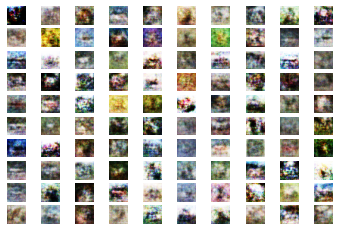

>saved: model_6248.h5
>6249, dr[0.707,0.453], df[0.700,0.562], g[0.717,0.438]
>6250, dr[0.654,0.578], df[0.721,0.516], g[0.711,0.453]
>6251, dr[0.718,0.406], df[0.653,0.641], g[0.697,0.453]
>6252, dr[0.706,0.438], df[0.722,0.516], g[0.704,0.500]
>6253, dr[0.665,0.641], df[0.691,0.562], g[0.719,0.375]
>6254, dr[0.699,0.500], df[0.732,0.516], g[0.741,0.328]
>6255, dr[0.732,0.406], df[0.694,0.547], g[0.727,0.453]
>6256, dr[0.693,0.500], df[0.705,0.484], g[0.717,0.359]
>6257, dr[0.703,0.438], df[0.659,0.719], g[0.720,0.359]
>6258, dr[0.705,0.484], df[0.647,0.703], g[0.768,0.312]
>6259, dr[0.699,0.484], df[0.661,0.656], g[0.735,0.375]
>6260, dr[0.701,0.531], df[0.670,0.609], g[0.718,0.391]
>6261, dr[0.742,0.328], df[0.653,0.750], g[0.740,0.406]
>6262, dr[0.723,0.438], df[0.692,0.578], g[0.717,0.438]
>6263, dr[0.699,0.594], df[0.665,0.672], g[0.722,0.453]
>6264, dr[0.704,0.516], df[0.710,0.516], g[0.726,0.469]
>6265, dr[0.699,0.453], df[0.711,0.516], g[0.720,0.453]
>6266, dr[0.693,0.547], df

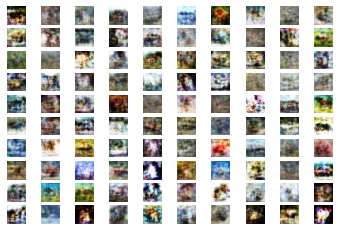

>saved: model_7029.h5
>7030, dr[0.667,0.516], df[0.693,0.641], g[0.738,0.281]
>7031, dr[0.689,0.422], df[0.690,0.609], g[0.746,0.312]
>7032, dr[0.677,0.516], df[0.700,0.578], g[0.736,0.312]
>7033, dr[0.758,0.297], df[0.669,0.719], g[0.738,0.375]
>7034, dr[0.710,0.484], df[0.660,0.688], g[0.706,0.406]
>7035, dr[0.686,0.469], df[0.666,0.609], g[0.735,0.312]
>7036, dr[0.697,0.484], df[0.701,0.547], g[0.700,0.422]
>7037, dr[0.675,0.500], df[0.684,0.625], g[0.736,0.344]
>7038, dr[0.695,0.500], df[0.673,0.594], g[0.738,0.391]
>7039, dr[0.699,0.453], df[0.710,0.562], g[0.748,0.328]
>7040, dr[0.704,0.438], df[0.681,0.500], g[0.743,0.359]
>7041, dr[0.704,0.406], df[0.700,0.531], g[0.725,0.406]
>7042, dr[0.659,0.516], df[0.689,0.547], g[0.753,0.359]
>7043, dr[0.678,0.547], df[0.714,0.438], g[0.743,0.344]
>7044, dr[0.666,0.625], df[0.705,0.531], g[0.745,0.281]
>7045, dr[0.659,0.594], df[0.710,0.500], g[0.759,0.391]
>7046, dr[0.665,0.516], df[0.659,0.703], g[0.746,0.375]
>7047, dr[0.669,0.547], df

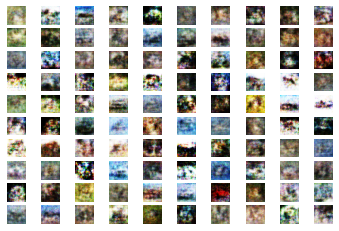

>saved: model_7810.h5
>7811, dr[0.683,0.531], df[0.685,0.516], g[0.741,0.312]
>7812, dr[0.676,0.469], df[0.665,0.656], g[0.728,0.359]
>7813, dr[0.693,0.484], df[0.687,0.594], g[0.738,0.297]
>7814, dr[0.753,0.297], df[0.655,0.656], g[0.709,0.375]
>7815, dr[0.689,0.484], df[0.653,0.672], g[0.746,0.312]
>7816, dr[0.714,0.469], df[0.674,0.609], g[0.730,0.359]
>7817, dr[0.704,0.422], df[0.728,0.438], g[0.738,0.297]
>7818, dr[0.710,0.438], df[0.715,0.531], g[0.738,0.391]
>7819, dr[0.684,0.406], df[0.638,0.734], g[0.751,0.312]
>7820, dr[0.693,0.594], df[0.650,0.719], g[0.742,0.375]
>7821, dr[0.698,0.500], df[0.656,0.672], g[0.748,0.438]
>7822, dr[0.704,0.500], df[0.694,0.547], g[0.764,0.312]
>7823, dr[0.649,0.625], df[0.653,0.641], g[0.734,0.359]
>7824, dr[0.711,0.406], df[0.668,0.578], g[0.783,0.266]
>7825, dr[0.697,0.469], df[0.669,0.641], g[0.778,0.266]
>7826, dr[0.717,0.406], df[0.688,0.594], g[0.774,0.234]
>7827, dr[0.680,0.531], df[0.667,0.672], g[0.766,0.328]
>7828, dr[0.749,0.344], df

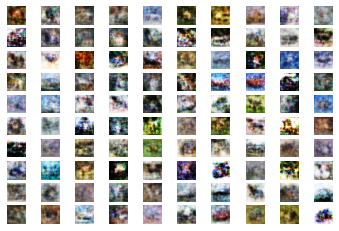

>saved: model_8591.h5
>8592, dr[0.721,0.406], df[0.683,0.578], g[0.726,0.438]
>8593, dr[0.698,0.469], df[0.737,0.484], g[0.713,0.453]
>8594, dr[0.687,0.484], df[0.707,0.531], g[0.712,0.453]
>8595, dr[0.711,0.422], df[0.702,0.531], g[0.691,0.453]
>8596, dr[0.681,0.531], df[0.715,0.500], g[0.741,0.391]
>8597, dr[0.685,0.547], df[0.681,0.625], g[0.712,0.484]
>8598, dr[0.675,0.484], df[0.707,0.500], g[0.716,0.453]
>8599, dr[0.701,0.531], df[0.668,0.609], g[0.746,0.438]
>8600, dr[0.693,0.500], df[0.723,0.516], g[0.726,0.344]
>8601, dr[0.678,0.531], df[0.718,0.562], g[0.706,0.547]
>8602, dr[0.690,0.516], df[0.702,0.547], g[0.711,0.406]
>8603, dr[0.700,0.438], df[0.695,0.516], g[0.742,0.359]
>8604, dr[0.704,0.453], df[0.693,0.547], g[0.741,0.359]
>8605, dr[0.712,0.469], df[0.697,0.516], g[0.742,0.312]
>8606, dr[0.696,0.453], df[0.704,0.578], g[0.749,0.312]
>8607, dr[0.679,0.547], df[0.683,0.641], g[0.748,0.375]
>8608, dr[0.671,0.547], df[0.687,0.641], g[0.735,0.375]
>8609, dr[0.697,0.438], df

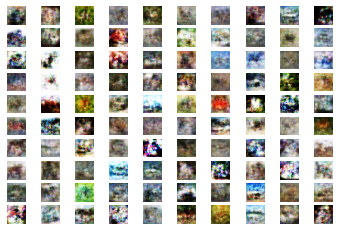

>saved: model_9372.h5
>9373, dr[0.713,0.422], df[0.686,0.656], g[0.701,0.469]
>9374, dr[0.687,0.516], df[0.672,0.578], g[0.723,0.391]
>9375, dr[0.714,0.438], df[0.689,0.625], g[0.704,0.469]
>9376, dr[0.681,0.500], df[0.729,0.516], g[0.711,0.422]
>9377, dr[0.710,0.453], df[0.713,0.594], g[0.667,0.469]
>9378, dr[0.689,0.531], df[0.726,0.500], g[0.733,0.328]
>9379, dr[0.692,0.516], df[0.662,0.609], g[0.724,0.453]
>9380, dr[0.700,0.391], df[0.725,0.547], g[0.745,0.391]
>9381, dr[0.714,0.406], df[0.687,0.594], g[0.726,0.469]
>9382, dr[0.714,0.406], df[0.693,0.609], g[0.726,0.422]
>9383, dr[0.700,0.469], df[0.667,0.609], g[0.736,0.312]
>9384, dr[0.717,0.484], df[0.749,0.531], g[0.713,0.375]
>9385, dr[0.709,0.453], df[0.683,0.609], g[0.719,0.422]
>9386, dr[0.760,0.281], df[0.713,0.594], g[0.723,0.391]
>9387, dr[0.694,0.484], df[0.691,0.562], g[0.724,0.391]
>9388, dr[0.691,0.438], df[0.697,0.547], g[0.752,0.328]
>9389, dr[0.711,0.375], df[0.661,0.672], g[0.750,0.359]
>9390, dr[0.719,0.422], df

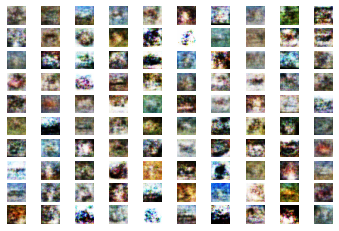

>saved: model_10153.h5
>10154, dr[0.709,0.391], df[0.682,0.672], g[0.752,0.281]
>10155, dr[0.697,0.469], df[0.701,0.594], g[0.714,0.469]
>10156, dr[0.678,0.562], df[0.664,0.609], g[0.746,0.328]
>10157, dr[0.736,0.438], df[0.730,0.359], g[0.723,0.344]
>10158, dr[0.674,0.547], df[0.676,0.625], g[0.731,0.453]
>10159, dr[0.681,0.422], df[0.684,0.500], g[0.737,0.406]
>10160, dr[0.681,0.500], df[0.735,0.453], g[0.722,0.375]
>10161, dr[0.721,0.422], df[0.688,0.625], g[0.715,0.391]
>10162, dr[0.665,0.625], df[0.729,0.547], g[0.732,0.391]
>10163, dr[0.653,0.516], df[0.703,0.500], g[0.744,0.375]
>10164, dr[0.683,0.484], df[0.701,0.609], g[0.754,0.250]
>10165, dr[0.708,0.422], df[0.664,0.672], g[0.686,0.484]
>10166, dr[0.685,0.547], df[0.673,0.688], g[0.697,0.438]
>10167, dr[0.670,0.531], df[0.689,0.547], g[0.730,0.406]
>10168, dr[0.689,0.562], df[0.730,0.453], g[0.723,0.391]
>10169, dr[0.729,0.406], df[0.714,0.531], g[0.721,0.406]
>10170, dr[0.659,0.531], df[0.685,0.625], g[0.711,0.391]
>10171, 

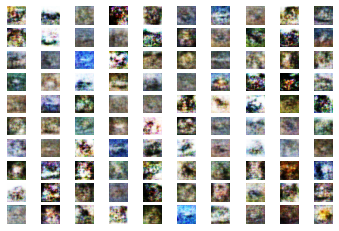

>saved: model_10934.h5
>10935, dr[0.675,0.578], df[0.752,0.375], g[0.740,0.359]
>10936, dr[0.727,0.406], df[0.714,0.500], g[0.687,0.484]
>10937, dr[0.697,0.406], df[0.703,0.469], g[0.725,0.359]
>10938, dr[0.675,0.516], df[0.686,0.688], g[0.749,0.234]
>10939, dr[0.712,0.375], df[0.694,0.562], g[0.728,0.375]
>10940, dr[0.701,0.516], df[0.689,0.531], g[0.759,0.219]
>10941, dr[0.674,0.547], df[0.674,0.609], g[0.730,0.344]
>10942, dr[0.690,0.453], df[0.675,0.641], g[0.744,0.359]
>10943, dr[0.700,0.469], df[0.692,0.547], g[0.740,0.297]
>10944, dr[0.729,0.453], df[0.692,0.594], g[0.764,0.281]
>10945, dr[0.707,0.469], df[0.683,0.594], g[0.753,0.266]
>10946, dr[0.696,0.453], df[0.670,0.625], g[0.757,0.281]
>10947, dr[0.730,0.453], df[0.680,0.641], g[0.772,0.297]
>10948, dr[0.689,0.484], df[0.672,0.609], g[0.779,0.172]
>10949, dr[0.725,0.375], df[0.648,0.781], g[0.710,0.375]
>10950, dr[0.719,0.406], df[0.667,0.688], g[0.747,0.312]
>10951, dr[0.698,0.469], df[0.672,0.641], g[0.793,0.250]
>10952, 

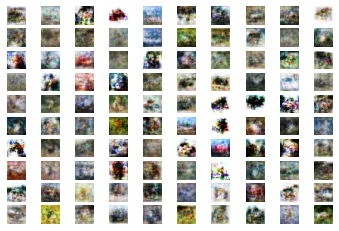

>saved: model_11715.h5
>11716, dr[0.750,0.312], df[0.681,0.609], g[0.762,0.250]
>11717, dr[0.735,0.375], df[0.668,0.625], g[0.793,0.188]
>11718, dr[0.766,0.234], df[0.668,0.578], g[0.739,0.391]
>11719, dr[0.732,0.359], df[0.657,0.641], g[0.763,0.250]
>11720, dr[0.725,0.422], df[0.679,0.641], g[0.764,0.281]
>11721, dr[0.718,0.484], df[0.677,0.578], g[0.741,0.344]
>11722, dr[0.733,0.344], df[0.681,0.594], g[0.719,0.344]
>11723, dr[0.690,0.500], df[0.676,0.672], g[0.745,0.219]
>11724, dr[0.711,0.422], df[0.699,0.547], g[0.707,0.453]
>11725, dr[0.718,0.328], df[0.698,0.547], g[0.731,0.328]
>11726, dr[0.665,0.609], df[0.721,0.578], g[0.741,0.375]
>11727, dr[0.698,0.500], df[0.731,0.547], g[0.767,0.234]
>11728, dr[0.710,0.422], df[0.665,0.719], g[0.750,0.297]
>11729, dr[0.699,0.484], df[0.663,0.656], g[0.778,0.219]
>11730, dr[0.712,0.406], df[0.707,0.562], g[0.756,0.312]
>11731, dr[0.668,0.562], df[0.688,0.688], g[0.707,0.406]
>11732, dr[0.659,0.594], df[0.697,0.547], g[0.753,0.359]
>11733, 

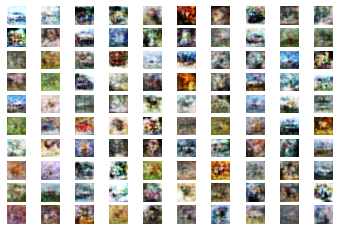

>saved: model_12496.h5
>12497, dr[0.705,0.422], df[0.713,0.453], g[0.764,0.234]
>12498, dr[0.718,0.422], df[0.667,0.688], g[0.756,0.203]
>12499, dr[0.728,0.312], df[0.676,0.625], g[0.739,0.312]
>12500, dr[0.716,0.375], df[0.704,0.453], g[0.724,0.406]
>12501, dr[0.701,0.453], df[0.674,0.688], g[0.717,0.375]
>12502, dr[0.733,0.344], df[0.665,0.594], g[0.759,0.266]
>12503, dr[0.714,0.375], df[0.674,0.641], g[0.734,0.344]
>12504, dr[0.723,0.359], df[0.682,0.578], g[0.741,0.328]
>12505, dr[0.716,0.422], df[0.688,0.656], g[0.749,0.188]
>12506, dr[0.684,0.484], df[0.661,0.672], g[0.767,0.250]
>12507, dr[0.725,0.344], df[0.667,0.656], g[0.764,0.297]
>12508, dr[0.723,0.391], df[0.657,0.703], g[0.774,0.172]
>12509, dr[0.727,0.328], df[0.642,0.812], g[0.769,0.281]
>12510, dr[0.737,0.344], df[0.634,0.797], g[0.771,0.297]
>12511, dr[0.702,0.516], df[0.643,0.719], g[0.769,0.281]
>12512, dr[0.720,0.500], df[0.664,0.703], g[0.763,0.312]
>12513, dr[0.718,0.422], df[0.637,0.750], g[0.774,0.203]
>12514, 

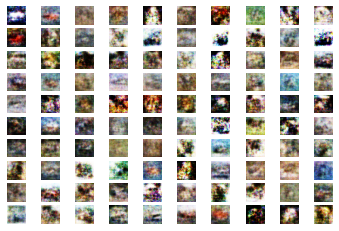

>saved: model_13277.h5
>13278, dr[0.726,0.484], df[0.679,0.641], g[0.711,0.469]
>13279, dr[0.687,0.516], df[0.716,0.547], g[0.735,0.344]
>13280, dr[0.677,0.531], df[0.693,0.578], g[0.741,0.359]
>13281, dr[0.744,0.375], df[0.679,0.625], g[0.717,0.406]
>13282, dr[0.674,0.594], df[0.682,0.578], g[0.762,0.359]
>13283, dr[0.687,0.594], df[0.701,0.531], g[0.723,0.406]
>13284, dr[0.717,0.453], df[0.701,0.453], g[0.716,0.500]
>13285, dr[0.700,0.547], df[0.692,0.500], g[0.724,0.406]
>13286, dr[0.684,0.516], df[0.718,0.531], g[0.750,0.359]
>13287, dr[0.718,0.422], df[0.709,0.500], g[0.714,0.406]
>13288, dr[0.697,0.531], df[0.672,0.641], g[0.744,0.281]
>13289, dr[0.712,0.438], df[0.679,0.625], g[0.730,0.406]
>13290, dr[0.691,0.422], df[0.651,0.688], g[0.775,0.328]
>13291, dr[0.736,0.375], df[0.671,0.656], g[0.733,0.422]
>13292, dr[0.741,0.359], df[0.697,0.656], g[0.765,0.281]
>13293, dr[0.689,0.516], df[0.675,0.562], g[0.780,0.344]
>13294, dr[0.720,0.453], df[0.651,0.672], g[0.743,0.422]
>13295, 

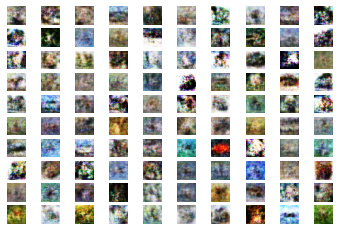

>saved: model_14058.h5
>14059, dr[0.686,0.547], df[0.721,0.516], g[0.752,0.297]
>14060, dr[0.758,0.375], df[0.687,0.531], g[0.770,0.266]
>14061, dr[0.702,0.469], df[0.685,0.547], g[0.713,0.391]
>14062, dr[0.724,0.422], df[0.676,0.578], g[0.761,0.297]
>14063, dr[0.694,0.469], df[0.685,0.625], g[0.755,0.359]
>14064, dr[0.695,0.422], df[0.676,0.531], g[0.728,0.406]
>14065, dr[0.721,0.359], df[0.683,0.609], g[0.726,0.375]
>14066, dr[0.701,0.438], df[0.656,0.734], g[0.716,0.438]
>14067, dr[0.713,0.453], df[0.665,0.688], g[0.759,0.375]
>14068, dr[0.700,0.406], df[0.680,0.703], g[0.712,0.375]
>14069, dr[0.695,0.438], df[0.742,0.516], g[0.697,0.469]
>14070, dr[0.713,0.359], df[0.670,0.641], g[0.727,0.375]
>14071, dr[0.734,0.406], df[0.682,0.625], g[0.736,0.422]
>14072, dr[0.728,0.391], df[0.709,0.516], g[0.724,0.422]
>14073, dr[0.713,0.406], df[0.704,0.453], g[0.726,0.406]
>14074, dr[0.716,0.375], df[0.727,0.500], g[0.759,0.250]
>14075, dr[0.737,0.375], df[0.708,0.391], g[0.712,0.453]
>14076, 

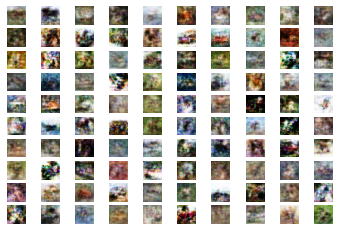

>saved: model_14839.h5
>14840, dr[0.683,0.500], df[0.725,0.578], g[0.716,0.438]
>14841, dr[0.678,0.484], df[0.711,0.516], g[0.697,0.453]
>14842, dr[0.681,0.547], df[0.710,0.484], g[0.720,0.344]
>14843, dr[0.713,0.484], df[0.706,0.625], g[0.760,0.312]
>14844, dr[0.706,0.469], df[0.724,0.578], g[0.748,0.344]
>14845, dr[0.668,0.516], df[0.672,0.594], g[0.764,0.250]
>14846, dr[0.685,0.438], df[0.681,0.609], g[0.730,0.359]
>14847, dr[0.647,0.578], df[0.695,0.469], g[0.717,0.484]
>14848, dr[0.677,0.531], df[0.765,0.531], g[0.691,0.516]
>14849, dr[0.717,0.406], df[0.727,0.484], g[0.746,0.312]
>14850, dr[0.643,0.609], df[0.707,0.516], g[0.760,0.359]
>14851, dr[0.687,0.516], df[0.677,0.688], g[0.689,0.453]
>14852, dr[0.683,0.469], df[0.759,0.438], g[0.763,0.281]
>14853, dr[0.695,0.453], df[0.738,0.500], g[0.743,0.297]
>14854, dr[0.680,0.500], df[0.650,0.688], g[0.759,0.266]
>14855, dr[0.686,0.484], df[0.675,0.609], g[0.749,0.391]
>14856, dr[0.697,0.516], df[0.641,0.719], g[0.759,0.297]
>14857, 

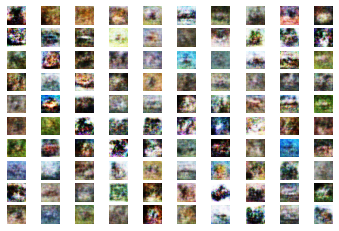

>saved: model_15620.h5
>15621, dr[0.719,0.391], df[0.672,0.625], g[0.718,0.344]
>15622, dr[0.738,0.359], df[0.682,0.656], g[0.750,0.312]
>15623, dr[0.688,0.484], df[0.651,0.719], g[0.731,0.375]
>15624, dr[0.699,0.516], df[0.702,0.500], g[0.685,0.531]
>15625, dr[0.662,0.594], df[0.701,0.578], g[0.726,0.406]
>15626, dr[0.676,0.562], df[0.696,0.578], g[0.728,0.359]
>15627, dr[0.693,0.484], df[0.691,0.625], g[0.722,0.359]
>15628, dr[0.684,0.500], df[0.710,0.562], g[0.708,0.422]
>15629, dr[0.678,0.531], df[0.720,0.578], g[0.715,0.422]
>15630, dr[0.671,0.578], df[0.703,0.547], g[0.724,0.391]
>15631, dr[0.690,0.484], df[0.727,0.594], g[0.707,0.438]
>15632, dr[0.672,0.562], df[0.703,0.578], g[0.726,0.422]
>15633, dr[0.668,0.531], df[0.731,0.438], g[0.736,0.359]
>15634, dr[0.701,0.547], df[0.713,0.531], g[0.724,0.375]
>15635, dr[0.677,0.516], df[0.725,0.453], g[0.696,0.469]
>15636, dr[0.681,0.500], df[0.705,0.469], g[0.729,0.406]
>15637, dr[0.725,0.438], df[0.725,0.516], g[0.718,0.391]
>15638, 

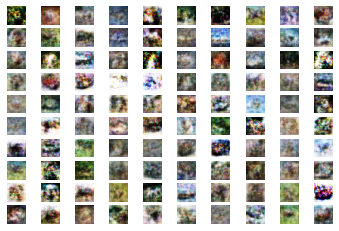

>saved: model_16401.h5
>16402, dr[0.663,0.516], df[0.683,0.609], g[0.757,0.297]
>16403, dr[0.738,0.312], df[0.721,0.562], g[0.739,0.422]
>16404, dr[0.684,0.516], df[0.687,0.562], g[0.715,0.391]
>16405, dr[0.674,0.547], df[0.694,0.562], g[0.749,0.281]
>16406, dr[0.685,0.547], df[0.689,0.578], g[0.741,0.391]
>16407, dr[0.706,0.406], df[0.693,0.562], g[0.742,0.312]
>16408, dr[0.664,0.547], df[0.725,0.438], g[0.766,0.312]
>16409, dr[0.691,0.438], df[0.691,0.609], g[0.747,0.328]
>16410, dr[0.708,0.484], df[0.657,0.594], g[0.735,0.453]
>16411, dr[0.666,0.609], df[0.666,0.625], g[0.743,0.344]
>16412, dr[0.670,0.531], df[0.671,0.609], g[0.762,0.328]
>16413, dr[0.731,0.328], df[0.718,0.531], g[0.725,0.422]
>16414, dr[0.666,0.547], df[0.722,0.531], g[0.696,0.422]
>16415, dr[0.686,0.531], df[0.678,0.641], g[0.752,0.344]
>16416, dr[0.681,0.484], df[0.693,0.609], g[0.755,0.328]
>16417, dr[0.702,0.391], df[0.674,0.594], g[0.759,0.250]
>16418, dr[0.700,0.531], df[0.675,0.609], g[0.778,0.250]
>16419, 

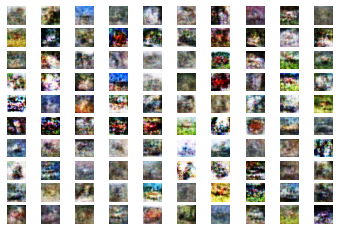

>saved: model_17182.h5
>17183, dr[0.710,0.422], df[0.678,0.625], g[0.731,0.406]
>17184, dr[0.706,0.375], df[0.699,0.516], g[0.710,0.500]
>17185, dr[0.707,0.453], df[0.704,0.578], g[0.755,0.281]
>17186, dr[0.705,0.453], df[0.677,0.578], g[0.726,0.500]
>17187, dr[0.702,0.484], df[0.691,0.516], g[0.742,0.359]
>17188, dr[0.723,0.375], df[0.682,0.547], g[0.723,0.359]
>17189, dr[0.685,0.516], df[0.684,0.531], g[0.710,0.422]
>17190, dr[0.672,0.484], df[0.693,0.562], g[0.699,0.484]
>17191, dr[0.710,0.453], df[0.698,0.500], g[0.719,0.422]
>17192, dr[0.696,0.438], df[0.692,0.531], g[0.712,0.516]
>17193, dr[0.662,0.609], df[0.694,0.562], g[0.738,0.359]
>17194, dr[0.709,0.453], df[0.703,0.547], g[0.719,0.438]
>17195, dr[0.682,0.547], df[0.701,0.531], g[0.724,0.391]
>17196, dr[0.737,0.297], df[0.682,0.562], g[0.718,0.438]
>17197, dr[0.702,0.500], df[0.690,0.562], g[0.712,0.422]
>17198, dr[0.705,0.469], df[0.672,0.562], g[0.760,0.328]
>17199, dr[0.669,0.547], df[0.711,0.438], g[0.772,0.297]
>17200, 

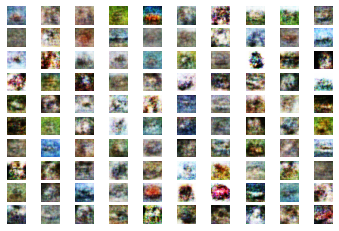

>saved: model_17963.h5
>17964, dr[0.739,0.406], df[0.699,0.531], g[0.738,0.375]
>17965, dr[0.682,0.484], df[0.676,0.609], g[0.764,0.234]
>17966, dr[0.724,0.531], df[0.698,0.609], g[0.745,0.312]
>17967, dr[0.693,0.531], df[0.691,0.562], g[0.712,0.344]
>17968, dr[0.725,0.438], df[0.739,0.484], g[0.722,0.406]
>17969, dr[0.698,0.484], df[0.666,0.672], g[0.730,0.406]
>17970, dr[0.690,0.422], df[0.673,0.609], g[0.735,0.391]
>17971, dr[0.693,0.531], df[0.679,0.625], g[0.690,0.391]
>17972, dr[0.707,0.422], df[0.713,0.562], g[0.705,0.406]
>17973, dr[0.667,0.547], df[0.708,0.516], g[0.683,0.531]
>17974, dr[0.687,0.531], df[0.724,0.484], g[0.704,0.375]
>17975, dr[0.646,0.703], df[0.722,0.484], g[0.717,0.438]
>17976, dr[0.703,0.438], df[0.734,0.422], g[0.697,0.531]
>17977, dr[0.723,0.406], df[0.703,0.562], g[0.683,0.531]
>17978, dr[0.688,0.578], df[0.694,0.609], g[0.711,0.328]
>17979, dr[0.693,0.484], df[0.720,0.438], g[0.697,0.484]
>17980, dr[0.683,0.469], df[0.690,0.562], g[0.702,0.406]
>17981, 

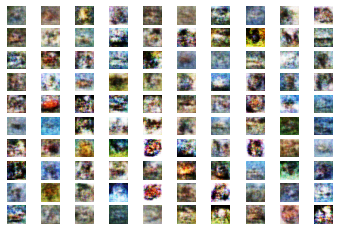

>saved: model_18744.h5
>18745, dr[0.694,0.516], df[0.697,0.453], g[0.731,0.391]
>18746, dr[0.681,0.469], df[0.717,0.453], g[0.747,0.391]
>18747, dr[0.677,0.500], df[0.715,0.484], g[0.757,0.297]
>18748, dr[0.690,0.484], df[0.699,0.594], g[0.761,0.250]
>18749, dr[0.666,0.594], df[0.658,0.703], g[0.734,0.328]
>18750, dr[0.689,0.562], df[0.768,0.453], g[0.722,0.422]
>18751, dr[0.706,0.453], df[0.688,0.641], g[0.731,0.328]
>18752, dr[0.693,0.500], df[0.674,0.609], g[0.726,0.375]
>18753, dr[0.660,0.562], df[0.723,0.438], g[0.729,0.422]
>18754, dr[0.654,0.656], df[0.683,0.562], g[0.709,0.453]
>18755, dr[0.647,0.609], df[0.720,0.578], g[0.726,0.375]
>18756, dr[0.652,0.547], df[0.720,0.453], g[0.702,0.500]
>18757, dr[0.590,0.750], df[0.710,0.453], g[0.719,0.422]
>18758, dr[0.647,0.578], df[0.683,0.594], g[0.748,0.359]
>18759, dr[0.663,0.547], df[0.689,0.641], g[0.739,0.391]
>18760, dr[0.646,0.625], df[0.704,0.547], g[0.722,0.438]
>18761, dr[0.697,0.406], df[0.764,0.484], g[0.691,0.422]
>18762, 

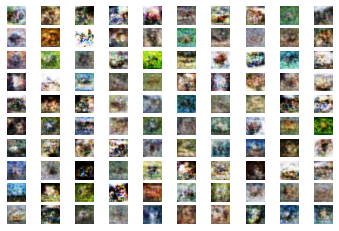

>saved: model_19525.h5
>19526, dr[0.695,0.516], df[0.686,0.641], g[0.740,0.312]
>19527, dr[0.703,0.484], df[0.670,0.672], g[0.721,0.359]
>19528, dr[0.696,0.469], df[0.671,0.594], g[0.735,0.312]
>19529, dr[0.685,0.453], df[0.682,0.656], g[0.732,0.250]
>19530, dr[0.702,0.516], df[0.694,0.562], g[0.743,0.328]
>19531, dr[0.686,0.484], df[0.690,0.625], g[0.737,0.312]
>19532, dr[0.679,0.500], df[0.673,0.625], g[0.731,0.297]
>19533, dr[0.655,0.578], df[0.691,0.609], g[0.753,0.359]
>19534, dr[0.664,0.609], df[0.650,0.766], g[0.724,0.344]
>19535, dr[0.686,0.531], df[0.678,0.578], g[0.732,0.391]
>19536, dr[0.669,0.547], df[0.730,0.469], g[0.718,0.375]
>19537, dr[0.637,0.672], df[0.690,0.547], g[0.724,0.422]
>19538, dr[0.655,0.656], df[0.676,0.609], g[0.723,0.453]
>19539, dr[0.681,0.531], df[0.741,0.516], g[0.716,0.406]
>19540, dr[0.717,0.484], df[0.748,0.453], g[0.730,0.438]
>19541, dr[0.681,0.531], df[0.657,0.672], g[0.732,0.375]
>19542, dr[0.668,0.578], df[0.671,0.594], g[0.715,0.359]
>19543, 

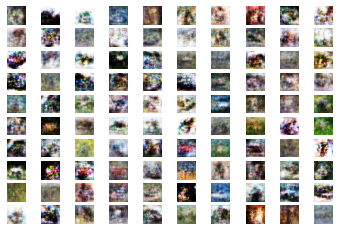

>saved: model_20306.h5
>20307, dr[0.684,0.562], df[0.693,0.625], g[0.731,0.328]
>20308, dr[0.721,0.469], df[0.717,0.469], g[0.724,0.391]
>20309, dr[0.687,0.562], df[0.689,0.484], g[0.733,0.375]
>20310, dr[0.673,0.531], df[0.719,0.453], g[0.752,0.344]
>20311, dr[0.689,0.531], df[0.677,0.547], g[0.688,0.531]
>20312, dr[0.679,0.562], df[0.734,0.469], g[0.713,0.406]
>20313, dr[0.695,0.469], df[0.678,0.625], g[0.716,0.391]
>20314, dr[0.702,0.469], df[0.712,0.438], g[0.733,0.281]
>20315, dr[0.686,0.516], df[0.676,0.547], g[0.734,0.359]
>20316, dr[0.727,0.422], df[0.670,0.656], g[0.733,0.406]
>20317, dr[0.712,0.453], df[0.707,0.531], g[0.725,0.453]
>20318, dr[0.729,0.422], df[0.671,0.625], g[0.773,0.250]
>20319, dr[0.689,0.500], df[0.652,0.734], g[0.714,0.453]
>20320, dr[0.721,0.438], df[0.670,0.641], g[0.757,0.312]
>20321, dr[0.687,0.500], df[0.703,0.531], g[0.749,0.344]
>20322, dr[0.683,0.531], df[0.678,0.547], g[0.767,0.328]
>20323, dr[0.672,0.516], df[0.679,0.562], g[0.722,0.438]
>20324, 

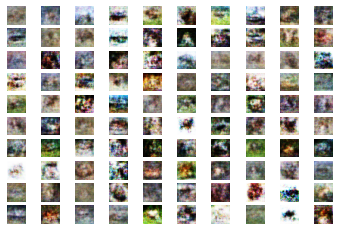

>saved: model_21087.h5
>21088, dr[0.719,0.422], df[0.678,0.578], g[0.716,0.438]
>21089, dr[0.737,0.344], df[0.689,0.562], g[0.762,0.359]
>21090, dr[0.732,0.391], df[0.649,0.625], g[0.730,0.359]
>21091, dr[0.722,0.406], df[0.676,0.562], g[0.749,0.328]
>21092, dr[0.712,0.422], df[0.693,0.578], g[0.757,0.281]
>21093, dr[0.688,0.531], df[0.702,0.531], g[0.710,0.438]
>21094, dr[0.686,0.516], df[0.679,0.609], g[0.724,0.438]
>21095, dr[0.703,0.500], df[0.664,0.625], g[0.742,0.266]
>21096, dr[0.659,0.609], df[0.672,0.656], g[0.758,0.297]
>21097, dr[0.690,0.453], df[0.729,0.500], g[0.747,0.359]
>21098, dr[0.701,0.438], df[0.670,0.734], g[0.768,0.250]
>21099, dr[0.719,0.453], df[0.694,0.625], g[0.727,0.344]
>21100, dr[0.696,0.516], df[0.660,0.719], g[0.733,0.344]
>21101, dr[0.731,0.344], df[0.679,0.578], g[0.710,0.406]
>21102, dr[0.691,0.500], df[0.697,0.641], g[0.742,0.328]
>21103, dr[0.725,0.359], df[0.675,0.656], g[0.760,0.312]
>21104, dr[0.731,0.406], df[0.674,0.594], g[0.749,0.344]
>21105, 

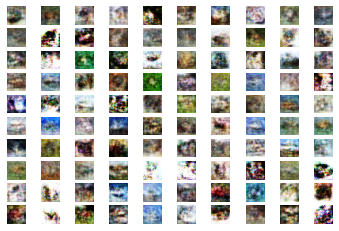

>saved: model_21868.h5
>21869, dr[0.719,0.453], df[0.676,0.625], g[0.746,0.328]
>21870, dr[0.717,0.422], df[0.689,0.609], g[0.732,0.438]
>21871, dr[0.669,0.609], df[0.717,0.469], g[0.742,0.391]
>21872, dr[0.696,0.516], df[0.695,0.531], g[0.736,0.406]
>21873, dr[0.724,0.438], df[0.662,0.703], g[0.717,0.422]
>21874, dr[0.707,0.484], df[0.680,0.578], g[0.734,0.422]
>21875, dr[0.682,0.531], df[0.696,0.578], g[0.710,0.422]
>21876, dr[0.661,0.578], df[0.681,0.594], g[0.705,0.453]
>21877, dr[0.650,0.688], df[0.692,0.531], g[0.722,0.422]
>21878, dr[0.690,0.484], df[0.714,0.516], g[0.751,0.312]
>21879, dr[0.685,0.500], df[0.679,0.594], g[0.704,0.438]
>21880, dr[0.677,0.578], df[0.698,0.578], g[0.732,0.359]
>21881, dr[0.696,0.516], df[0.762,0.406], g[0.718,0.406]
>21882, dr[0.709,0.516], df[0.697,0.531], g[0.766,0.266]
>21883, dr[0.687,0.469], df[0.713,0.500], g[0.710,0.453]
>21884, dr[0.656,0.562], df[0.701,0.531], g[0.730,0.391]
>21885, dr[0.682,0.500], df[0.672,0.625], g[0.726,0.375]
>21886, 

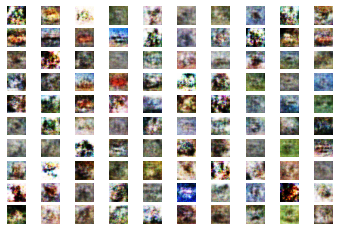

>saved: model_22649.h5
>22650, dr[0.687,0.453], df[0.673,0.562], g[0.772,0.312]
>22651, dr[0.706,0.391], df[0.700,0.516], g[0.769,0.312]
>22652, dr[0.696,0.469], df[0.666,0.656], g[0.773,0.406]
>22653, dr[0.658,0.609], df[0.647,0.750], g[0.788,0.281]
>22654, dr[0.701,0.438], df[0.673,0.656], g[0.754,0.297]
>22655, dr[0.695,0.453], df[0.687,0.531], g[0.765,0.266]
>22656, dr[0.682,0.531], df[0.709,0.594], g[0.720,0.375]
>22657, dr[0.723,0.484], df[0.711,0.484], g[0.705,0.281]
>22658, dr[0.674,0.500], df[0.734,0.484], g[0.761,0.297]
>22659, dr[0.712,0.469], df[0.724,0.469], g[0.719,0.375]
>22660, dr[0.696,0.516], df[0.679,0.531], g[0.722,0.359]
>22661, dr[0.720,0.344], df[0.682,0.641], g[0.733,0.375]
>22662, dr[0.697,0.438], df[0.691,0.641], g[0.719,0.422]
>22663, dr[0.699,0.500], df[0.695,0.531], g[0.718,0.391]
>22664, dr[0.723,0.406], df[0.700,0.594], g[0.742,0.312]
>22665, dr[0.711,0.391], df[0.669,0.672], g[0.725,0.391]
>22666, dr[0.705,0.516], df[0.695,0.562], g[0.735,0.391]
>22667, 

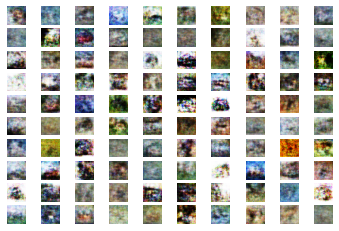

>saved: model_23430.h5
>23431, dr[0.670,0.594], df[0.727,0.484], g[0.719,0.438]
>23432, dr[0.708,0.406], df[0.709,0.547], g[0.727,0.359]
>23433, dr[0.681,0.516], df[0.678,0.609], g[0.730,0.422]
>23434, dr[0.696,0.500], df[0.655,0.656], g[0.739,0.406]
>23435, dr[0.712,0.500], df[0.718,0.453], g[0.740,0.391]
>23436, dr[0.684,0.469], df[0.685,0.531], g[0.718,0.484]
>23437, dr[0.695,0.500], df[0.688,0.547], g[0.732,0.391]
>23438, dr[0.721,0.391], df[0.717,0.453], g[0.724,0.391]
>23439, dr[0.694,0.516], df[0.706,0.469], g[0.726,0.359]
>23440, dr[0.693,0.500], df[0.703,0.578], g[0.727,0.359]
>23441, dr[0.721,0.375], df[0.705,0.500], g[0.705,0.484]
>23442, dr[0.675,0.484], df[0.696,0.469], g[0.710,0.469]
>23443, dr[0.695,0.531], df[0.718,0.531], g[0.702,0.484]
>23444, dr[0.687,0.500], df[0.715,0.469], g[0.724,0.406]
>23445, dr[0.705,0.469], df[0.705,0.469], g[0.712,0.391]
>23446, dr[0.685,0.516], df[0.700,0.484], g[0.742,0.328]
>23447, dr[0.688,0.516], df[0.699,0.516], g[0.704,0.438]
>23448, 

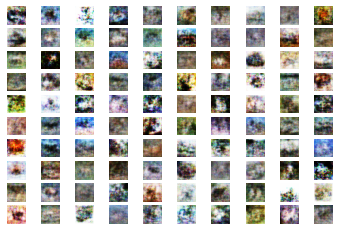

>saved: model_24211.h5
>24212, dr[0.700,0.484], df[0.683,0.578], g[0.774,0.297]
>24213, dr[0.682,0.562], df[0.729,0.484], g[0.770,0.281]
>24214, dr[0.695,0.594], df[0.714,0.484], g[0.731,0.469]
>24215, dr[0.687,0.500], df[0.686,0.594], g[0.732,0.438]
>24216, dr[0.766,0.297], df[0.721,0.469], g[0.716,0.375]
>24217, dr[0.687,0.484], df[0.694,0.547], g[0.723,0.375]
>24218, dr[0.706,0.422], df[0.669,0.641], g[0.749,0.312]
>24219, dr[0.698,0.453], df[0.689,0.625], g[0.746,0.344]
>24220, dr[0.706,0.469], df[0.685,0.594], g[0.726,0.438]
>24221, dr[0.701,0.484], df[0.674,0.656], g[0.751,0.328]
>24222, dr[0.684,0.500], df[0.685,0.531], g[0.746,0.328]
>24223, dr[0.703,0.516], df[0.677,0.609], g[0.722,0.328]
>24224, dr[0.699,0.422], df[0.700,0.516], g[0.721,0.344]
>24225, dr[0.716,0.406], df[0.684,0.609], g[0.696,0.469]
>24226, dr[0.704,0.422], df[0.716,0.500], g[0.716,0.422]
>24227, dr[0.657,0.562], df[0.705,0.469], g[0.729,0.297]
>24228, dr[0.677,0.516], df[0.737,0.500], g[0.686,0.422]
>24229, 

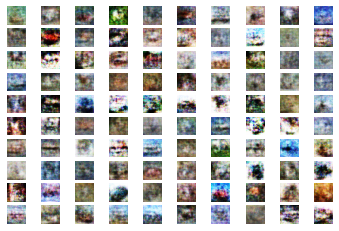

>saved: model_24992.h5
>24993, dr[0.682,0.531], df[0.695,0.578], g[0.755,0.312]
>24994, dr[0.683,0.516], df[0.701,0.516], g[0.748,0.391]
>24995, dr[0.688,0.531], df[0.740,0.500], g[0.719,0.312]
>24996, dr[0.678,0.547], df[0.715,0.547], g[0.744,0.297]
>24997, dr[0.704,0.453], df[0.700,0.531], g[0.732,0.406]
>24998, dr[0.698,0.484], df[0.668,0.641], g[0.732,0.375]
>24999, dr[0.695,0.453], df[0.659,0.641], g[0.725,0.438]
>25000, dr[0.696,0.469], df[0.680,0.625], g[0.733,0.375]
>25001, dr[0.686,0.469], df[0.694,0.625], g[0.717,0.406]
>25002, dr[0.688,0.531], df[0.684,0.578], g[0.743,0.344]
>25003, dr[0.670,0.578], df[0.748,0.484], g[0.724,0.344]
>25004, dr[0.714,0.406], df[0.704,0.562], g[0.715,0.391]
>25005, dr[0.683,0.438], df[0.689,0.516], g[0.722,0.422]
>25006, dr[0.723,0.422], df[0.681,0.656], g[0.719,0.453]
>25007, dr[0.675,0.547], df[0.691,0.625], g[0.770,0.219]
>25008, dr[0.666,0.547], df[0.667,0.641], g[0.729,0.391]
>25009, dr[0.693,0.469], df[0.735,0.484], g[0.755,0.328]
>25010, 

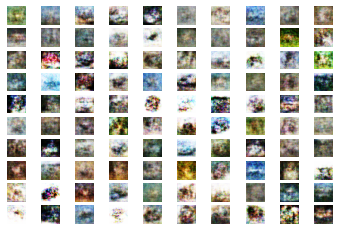

>saved: model_25773.h5
>25774, dr[0.703,0.500], df[0.687,0.562], g[0.746,0.312]
>25775, dr[0.708,0.562], df[0.653,0.672], g[0.702,0.453]
>25776, dr[0.672,0.594], df[0.684,0.594], g[0.720,0.391]
>25777, dr[0.729,0.375], df[0.686,0.547], g[0.726,0.438]
>25778, dr[0.699,0.438], df[0.698,0.562], g[0.756,0.328]
>25779, dr[0.688,0.500], df[0.677,0.641], g[0.723,0.453]
>25780, dr[0.697,0.500], df[0.666,0.594], g[0.710,0.516]
>25781, dr[0.741,0.438], df[0.671,0.641], g[0.728,0.406]
>25782, dr[0.724,0.406], df[0.721,0.438], g[0.719,0.453]
>25783, dr[0.701,0.484], df[0.702,0.531], g[0.707,0.516]
>25784, dr[0.705,0.422], df[0.706,0.500], g[0.721,0.312]
>25785, dr[0.659,0.547], df[0.665,0.625], g[0.709,0.422]
>25786, dr[0.707,0.438], df[0.675,0.516], g[0.746,0.375]
>25787, dr[0.722,0.328], df[0.711,0.516], g[0.719,0.344]
>25788, dr[0.700,0.484], df[0.705,0.578], g[0.733,0.422]
>25789, dr[0.663,0.625], df[0.752,0.438], g[0.706,0.500]
>25790, dr[0.732,0.422], df[0.700,0.531], g[0.709,0.453]
>25791, 

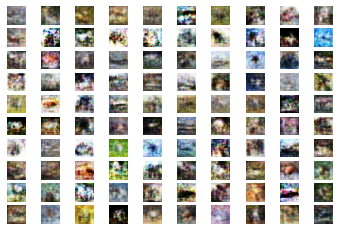

>saved: model_26554.h5
>26555, dr[0.713,0.484], df[0.697,0.562], g[0.728,0.391]
>26556, dr[0.684,0.516], df[0.662,0.641], g[0.732,0.406]
>26557, dr[0.662,0.547], df[0.687,0.641], g[0.732,0.438]
>26558, dr[0.723,0.422], df[0.699,0.562], g[0.703,0.484]
>26559, dr[0.687,0.500], df[0.733,0.422], g[0.721,0.438]
>26560, dr[0.724,0.422], df[0.712,0.516], g[0.701,0.453]
>26561, dr[0.682,0.469], df[0.725,0.422], g[0.704,0.516]
>26562, dr[0.732,0.344], df[0.697,0.625], g[0.731,0.328]
>26563, dr[0.735,0.344], df[0.668,0.578], g[0.720,0.422]
>26564, dr[0.715,0.453], df[0.709,0.484], g[0.742,0.391]
>26565, dr[0.674,0.578], df[0.705,0.453], g[0.735,0.438]
>26566, dr[0.693,0.516], df[0.718,0.516], g[0.687,0.484]
>26567, dr[0.693,0.484], df[0.706,0.469], g[0.718,0.453]
>26568, dr[0.687,0.531], df[0.685,0.562], g[0.702,0.547]
>26569, dr[0.696,0.562], df[0.733,0.484], g[0.735,0.359]
>26570, dr[0.694,0.516], df[0.694,0.500], g[0.719,0.359]
>26571, dr[0.725,0.453], df[0.729,0.469], g[0.701,0.406]
>26572, 

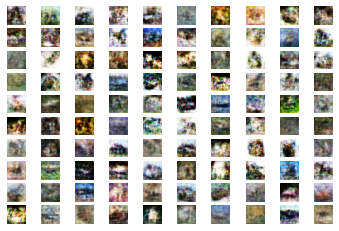

>saved: model_27335.h5
>27336, dr[0.683,0.484], df[0.713,0.547], g[0.731,0.344]
>27337, dr[0.709,0.438], df[0.679,0.656], g[0.750,0.359]
>27338, dr[0.671,0.562], df[0.683,0.594], g[0.734,0.422]
>27339, dr[0.713,0.359], df[0.744,0.406], g[0.745,0.344]
>27340, dr[0.696,0.516], df[0.702,0.516], g[0.741,0.297]
>27341, dr[0.695,0.594], df[0.696,0.547], g[0.732,0.391]
>27342, dr[0.672,0.594], df[0.717,0.484], g[0.721,0.375]
>27343, dr[0.681,0.531], df[0.681,0.609], g[0.711,0.500]
>27344, dr[0.716,0.531], df[0.697,0.484], g[0.694,0.453]
>27345, dr[0.676,0.531], df[0.712,0.484], g[0.727,0.422]
>27346, dr[0.684,0.531], df[0.641,0.656], g[0.770,0.266]
>27347, dr[0.715,0.469], df[0.703,0.500], g[0.721,0.391]
>27348, dr[0.670,0.531], df[0.692,0.531], g[0.678,0.562]
>27349, dr[0.689,0.516], df[0.728,0.438], g[0.731,0.359]
>27350, dr[0.666,0.578], df[0.714,0.453], g[0.718,0.375]
>27351, dr[0.672,0.547], df[0.699,0.531], g[0.737,0.328]
>27352, dr[0.689,0.469], df[0.696,0.547], g[0.719,0.438]
>27353, 

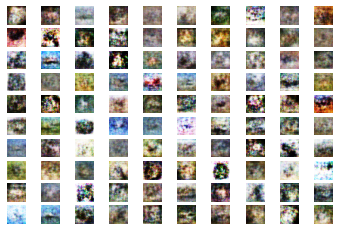

>saved: model_28116.h5
>28117, dr[0.683,0.438], df[0.685,0.609], g[0.740,0.328]
>28118, dr[0.694,0.500], df[0.686,0.609], g[0.750,0.344]
>28119, dr[0.690,0.438], df[0.662,0.625], g[0.725,0.453]
>28120, dr[0.678,0.531], df[0.682,0.562], g[0.737,0.406]
>28121, dr[0.681,0.516], df[0.731,0.484], g[0.740,0.391]
>28122, dr[0.679,0.516], df[0.730,0.484], g[0.715,0.453]
>28123, dr[0.688,0.531], df[0.671,0.656], g[0.756,0.391]
>28124, dr[0.732,0.422], df[0.695,0.594], g[0.729,0.359]
>28125, dr[0.734,0.438], df[0.706,0.500], g[0.739,0.375]
>28126, dr[0.755,0.359], df[0.707,0.500], g[0.717,0.422]
>28127, dr[0.715,0.438], df[0.676,0.609], g[0.727,0.391]
>28128, dr[0.691,0.469], df[0.697,0.516], g[0.715,0.406]
>28129, dr[0.689,0.500], df[0.678,0.578], g[0.707,0.422]
>28130, dr[0.688,0.453], df[0.683,0.641], g[0.715,0.453]
>28131, dr[0.693,0.516], df[0.658,0.672], g[0.720,0.406]
>28132, dr[0.692,0.531], df[0.667,0.625], g[0.770,0.344]
>28133, dr[0.711,0.453], df[0.700,0.562], g[0.738,0.406]
>28134, 

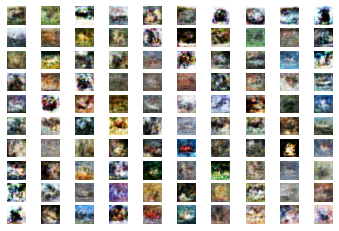

>saved: model_28897.h5
>28898, dr[0.699,0.453], df[0.676,0.641], g[0.690,0.453]
>28899, dr[0.705,0.438], df[0.705,0.594], g[0.715,0.453]
>28900, dr[0.657,0.625], df[0.716,0.547], g[0.717,0.469]
>28901, dr[0.705,0.500], df[0.676,0.609], g[0.730,0.344]
>28902, dr[0.716,0.375], df[0.684,0.562], g[0.742,0.375]
>28903, dr[0.656,0.562], df[0.711,0.516], g[0.766,0.297]
>28904, dr[0.728,0.500], df[0.688,0.562], g[0.720,0.422]
>28905, dr[0.686,0.500], df[0.722,0.453], g[0.724,0.422]
>28906, dr[0.675,0.547], df[0.742,0.516], g[0.726,0.297]
>28907, dr[0.703,0.453], df[0.718,0.516], g[0.720,0.344]
>28908, dr[0.693,0.469], df[0.720,0.500], g[0.699,0.469]
>28909, dr[0.695,0.438], df[0.683,0.578], g[0.714,0.375]
>28910, dr[0.686,0.469], df[0.680,0.578], g[0.739,0.328]
>28911, dr[0.702,0.578], df[0.691,0.547], g[0.774,0.281]
>28912, dr[0.700,0.516], df[0.682,0.594], g[0.696,0.469]
>28913, dr[0.666,0.578], df[0.705,0.594], g[0.749,0.406]
>28914, dr[0.721,0.359], df[0.726,0.406], g[0.728,0.422]
>28915, 

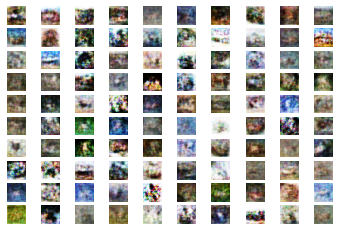

>saved: model_29678.h5
>29679, dr[0.686,0.531], df[0.693,0.625], g[0.772,0.281]
>29680, dr[0.674,0.500], df[0.680,0.562], g[0.756,0.359]
>29681, dr[0.671,0.484], df[0.675,0.594], g[0.801,0.219]
>29682, dr[0.694,0.531], df[0.711,0.422], g[0.727,0.453]
>29683, dr[0.660,0.531], df[0.707,0.547], g[0.719,0.484]
>29684, dr[0.729,0.469], df[0.714,0.547], g[0.757,0.344]
>29685, dr[0.714,0.469], df[0.699,0.578], g[0.765,0.281]
>29686, dr[0.700,0.469], df[0.695,0.578], g[0.747,0.297]
>29687, dr[0.722,0.391], df[0.727,0.484], g[0.736,0.281]
>29688, dr[0.689,0.469], df[0.694,0.688], g[0.733,0.312]
>29689, dr[0.663,0.516], df[0.684,0.609], g[0.749,0.422]
>29690, dr[0.681,0.500], df[0.694,0.547], g[0.719,0.344]
>29691, dr[0.703,0.453], df[0.673,0.672], g[0.760,0.266]
>29692, dr[0.690,0.469], df[0.708,0.516], g[0.750,0.250]
>29693, dr[0.703,0.406], df[0.701,0.625], g[0.720,0.359]
>29694, dr[0.683,0.562], df[0.666,0.625], g[0.728,0.328]
>29695, dr[0.690,0.531], df[0.688,0.609], g[0.728,0.266]
>29696, 

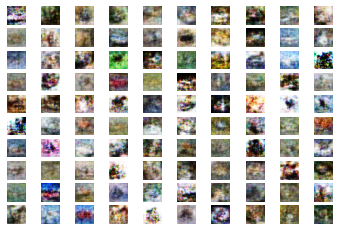

>saved: model_30459.h5
>30460, dr[0.654,0.562], df[0.674,0.609], g[0.735,0.375]
>30461, dr[0.697,0.484], df[0.684,0.562], g[0.736,0.344]
>30462, dr[0.696,0.453], df[0.714,0.609], g[0.748,0.297]
>30463, dr[0.700,0.453], df[0.697,0.531], g[0.780,0.219]
>30464, dr[0.706,0.438], df[0.655,0.672], g[0.742,0.344]
>30465, dr[0.693,0.531], df[0.690,0.531], g[0.746,0.328]
>30466, dr[0.653,0.594], df[0.684,0.625], g[0.768,0.281]
>30467, dr[0.661,0.562], df[0.684,0.594], g[0.754,0.453]
>30468, dr[0.687,0.547], df[0.660,0.703], g[0.774,0.359]
>30469, dr[0.692,0.484], df[0.655,0.578], g[0.756,0.422]
>30470, dr[0.714,0.453], df[0.663,0.641], g[0.768,0.328]
>30471, dr[0.719,0.453], df[0.733,0.516], g[0.746,0.391]
>30472, dr[0.678,0.500], df[0.656,0.656], g[0.732,0.391]
>30473, dr[0.648,0.594], df[0.667,0.641], g[0.734,0.422]
>30474, dr[0.763,0.359], df[0.715,0.516], g[0.740,0.312]
>30475, dr[0.722,0.438], df[0.683,0.578], g[0.731,0.344]
>30476, dr[0.691,0.484], df[0.704,0.594], g[0.722,0.453]
>30477, 

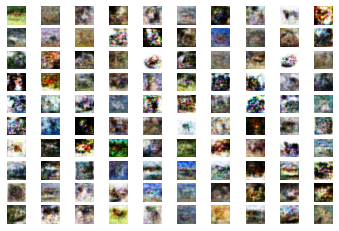

>saved: model_31240.h5
>31241, dr[0.713,0.453], df[0.646,0.672], g[0.737,0.281]
>31242, dr[0.713,0.375], df[0.694,0.594], g[0.722,0.406]
>31243, dr[0.742,0.328], df[0.708,0.500], g[0.725,0.375]
>31244, dr[0.720,0.359], df[0.682,0.531], g[0.743,0.375]
>31245, dr[0.713,0.469], df[0.692,0.594], g[0.724,0.469]
>31246, dr[0.703,0.422], df[0.682,0.609], g[0.757,0.266]
>31247, dr[0.706,0.484], df[0.654,0.641], g[0.732,0.391]
>31248, dr[0.717,0.422], df[0.715,0.516], g[0.766,0.312]
>31249, dr[0.727,0.281], df[0.669,0.703], g[0.739,0.328]
>31250, dr[0.682,0.531], df[0.675,0.688], g[0.717,0.359]
>31251, dr[0.679,0.484], df[0.689,0.656], g[0.726,0.328]
>31252, dr[0.715,0.422], df[0.681,0.688], g[0.729,0.375]
>31253, dr[0.699,0.469], df[0.680,0.641], g[0.758,0.297]
>31254, dr[0.704,0.453], df[0.695,0.578], g[0.737,0.312]
>31255, dr[0.720,0.406], df[0.676,0.609], g[0.703,0.438]
>31256, dr[0.721,0.359], df[0.661,0.719], g[0.760,0.219]
>31257, dr[0.706,0.453], df[0.684,0.625], g[0.732,0.344]
>31258, 

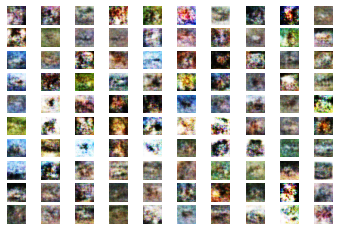

>saved: model_32021.h5
>32022, dr[0.688,0.500], df[0.715,0.500], g[0.699,0.406]
>32023, dr[0.670,0.641], df[0.711,0.484], g[0.714,0.469]
>32024, dr[0.681,0.594], df[0.711,0.484], g[0.718,0.469]
>32025, dr[0.665,0.484], df[0.679,0.562], g[0.721,0.344]
>32026, dr[0.709,0.516], df[0.704,0.531], g[0.707,0.422]
>32027, dr[0.670,0.562], df[0.714,0.500], g[0.728,0.406]
>32028, dr[0.697,0.469], df[0.701,0.453], g[0.707,0.438]
>32029, dr[0.702,0.500], df[0.704,0.594], g[0.721,0.469]
>32030, dr[0.720,0.453], df[0.669,0.672], g[0.735,0.359]
>32031, dr[0.694,0.531], df[0.676,0.656], g[0.719,0.469]
>32032, dr[0.731,0.406], df[0.680,0.578], g[0.698,0.438]
>32033, dr[0.695,0.438], df[0.718,0.469], g[0.737,0.391]
>32034, dr[0.707,0.438], df[0.686,0.547], g[0.711,0.453]
>32035, dr[0.705,0.438], df[0.717,0.453], g[0.726,0.312]
>32036, dr[0.713,0.453], df[0.707,0.500], g[0.732,0.438]
>32037, dr[0.696,0.438], df[0.666,0.562], g[0.737,0.422]
>32038, dr[0.688,0.516], df[0.698,0.531], g[0.743,0.344]
>32039, 

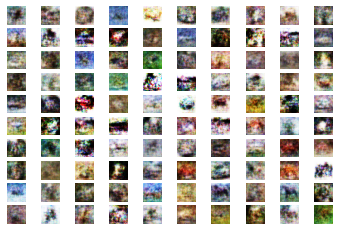

>saved: model_32802.h5
>32803, dr[0.692,0.422], df[0.674,0.625], g[0.722,0.359]
>32804, dr[0.700,0.453], df[0.722,0.547], g[0.735,0.312]
>32805, dr[0.651,0.594], df[0.680,0.625], g[0.773,0.391]
>32806, dr[0.660,0.547], df[0.694,0.594], g[0.739,0.312]
>32807, dr[0.727,0.406], df[0.691,0.641], g[0.760,0.328]
>32808, dr[0.685,0.531], df[0.702,0.562], g[0.740,0.422]
>32809, dr[0.709,0.453], df[0.680,0.516], g[0.781,0.297]
>32810, dr[0.690,0.438], df[0.698,0.500], g[0.709,0.438]
>32811, dr[0.724,0.391], df[0.689,0.609], g[0.723,0.344]
>32812, dr[0.730,0.422], df[0.697,0.578], g[0.716,0.312]
>32813, dr[0.663,0.531], df[0.718,0.625], g[0.734,0.391]
>32814, dr[0.696,0.516], df[0.708,0.594], g[0.713,0.469]
>32815, dr[0.671,0.578], df[0.720,0.547], g[0.737,0.406]
>32816, dr[0.669,0.578], df[0.709,0.578], g[0.730,0.422]
>32817, dr[0.726,0.375], df[0.742,0.438], g[0.720,0.453]
>32818, dr[0.680,0.531], df[0.697,0.656], g[0.762,0.344]
>32819, dr[0.685,0.547], df[0.694,0.703], g[0.747,0.281]
>32820, 

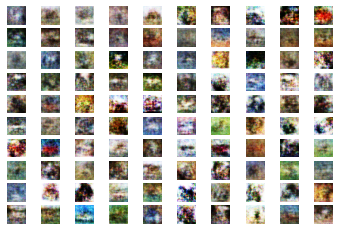

>saved: model_33583.h5
>33584, dr[0.719,0.375], df[0.677,0.594], g[0.726,0.469]
>33585, dr[0.731,0.422], df[0.717,0.484], g[0.710,0.484]
>33586, dr[0.731,0.375], df[0.701,0.453], g[0.702,0.406]
>33587, dr[0.692,0.469], df[0.674,0.547], g[0.718,0.453]
>33588, dr[0.687,0.609], df[0.685,0.531], g[0.730,0.359]
>33589, dr[0.701,0.406], df[0.682,0.578], g[0.714,0.359]
>33590, dr[0.700,0.453], df[0.677,0.625], g[0.708,0.500]
>33591, dr[0.672,0.578], df[0.679,0.578], g[0.690,0.531]
>33592, dr[0.729,0.359], df[0.674,0.609], g[0.706,0.359]
>33593, dr[0.693,0.438], df[0.715,0.578], g[0.715,0.391]
>33594, dr[0.694,0.500], df[0.674,0.594], g[0.716,0.453]
>33595, dr[0.678,0.469], df[0.680,0.641], g[0.714,0.438]
>33596, dr[0.701,0.484], df[0.695,0.484], g[0.748,0.359]
>33597, dr[0.697,0.484], df[0.706,0.406], g[0.695,0.438]
>33598, dr[0.707,0.531], df[0.682,0.578], g[0.716,0.406]
>33599, dr[0.692,0.531], df[0.667,0.594], g[0.725,0.453]
>33600, dr[0.642,0.703], df[0.659,0.703], g[0.717,0.453]
>33601, 

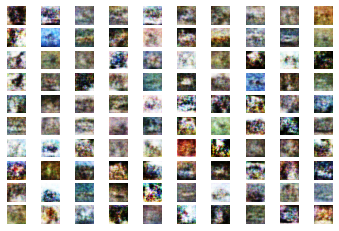

>saved: model_34364.h5
>34365, dr[0.699,0.531], df[0.637,0.734], g[0.768,0.203]
>34366, dr[0.739,0.375], df[0.642,0.734], g[0.740,0.281]
>34367, dr[0.719,0.375], df[0.687,0.625], g[0.761,0.250]
>34368, dr[0.704,0.438], df[0.672,0.531], g[0.734,0.375]
>34369, dr[0.707,0.438], df[0.667,0.688], g[0.745,0.297]
>34370, dr[0.676,0.547], df[0.662,0.688], g[0.745,0.406]
>34371, dr[0.696,0.422], df[0.713,0.531], g[0.745,0.359]
>34372, dr[0.670,0.562], df[0.709,0.469], g[0.778,0.266]
>34373, dr[0.670,0.562], df[0.680,0.578], g[0.741,0.281]
>34374, dr[0.681,0.531], df[0.667,0.641], g[0.756,0.266]
>34375, dr[0.693,0.484], df[0.658,0.688], g[0.735,0.312]
>34376, dr[0.683,0.516], df[0.715,0.562], g[0.715,0.422]
>34377, dr[0.723,0.375], df[0.671,0.656], g[0.694,0.516]
>34378, dr[0.698,0.453], df[0.737,0.469], g[0.723,0.359]
>34379, dr[0.717,0.438], df[0.680,0.625], g[0.723,0.453]
>34380, dr[0.698,0.453], df[0.655,0.625], g[0.723,0.422]
>34381, dr[0.695,0.531], df[0.701,0.641], g[0.700,0.453]
>34382, 

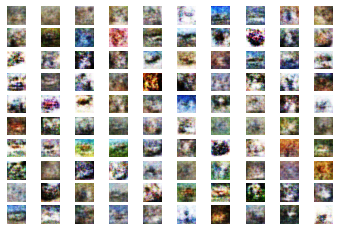

>saved: model_35145.h5
>35146, dr[0.748,0.359], df[0.665,0.672], g[0.758,0.328]
>35147, dr[0.698,0.500], df[0.649,0.688], g[0.759,0.250]
>35148, dr[0.745,0.328], df[0.655,0.703], g[0.749,0.328]
>35149, dr[0.685,0.469], df[0.678,0.656], g[0.741,0.328]
>35150, dr[0.729,0.406], df[0.651,0.625], g[0.770,0.250]
>35151, dr[0.743,0.312], df[0.690,0.594], g[0.731,0.406]
>35152, dr[0.711,0.406], df[0.709,0.516], g[0.722,0.406]
>35153, dr[0.739,0.297], df[0.693,0.562], g[0.748,0.188]
>35154, dr[0.716,0.359], df[0.708,0.531], g[0.753,0.281]
>35155, dr[0.677,0.516], df[0.682,0.562], g[0.733,0.344]
>35156, dr[0.711,0.453], df[0.678,0.578], g[0.769,0.219]
>35157, dr[0.665,0.594], df[0.701,0.609], g[0.754,0.344]
>35158, dr[0.695,0.484], df[0.662,0.734], g[0.746,0.328]
>35159, dr[0.694,0.500], df[0.684,0.641], g[0.739,0.375]
>35160, dr[0.690,0.469], df[0.668,0.656], g[0.775,0.266]
>35161, dr[0.727,0.422], df[0.689,0.656], g[0.743,0.328]
>35162, dr[0.710,0.406], df[0.658,0.688], g[0.735,0.375]
>35163, 

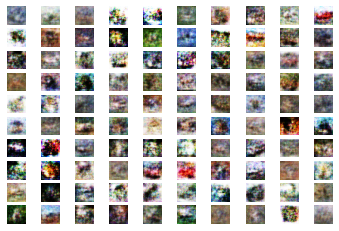

>saved: model_35926.h5
>35927, dr[0.732,0.406], df[0.679,0.547], g[0.743,0.406]
>35928, dr[0.687,0.516], df[0.704,0.469], g[0.741,0.359]
>35929, dr[0.698,0.484], df[0.690,0.516], g[0.763,0.328]
>35930, dr[0.669,0.516], df[0.695,0.562], g[0.762,0.312]
>35931, dr[0.729,0.391], df[0.650,0.688], g[0.755,0.375]
>35932, dr[0.706,0.406], df[0.641,0.656], g[0.735,0.453]
>35933, dr[0.666,0.594], df[0.683,0.609], g[0.737,0.312]
>35934, dr[0.717,0.500], df[0.714,0.484], g[0.705,0.453]
>35935, dr[0.659,0.531], df[0.713,0.484], g[0.758,0.344]
>35936, dr[0.710,0.469], df[0.741,0.484], g[0.716,0.453]
>35937, dr[0.659,0.562], df[0.681,0.594], g[0.714,0.453]
>35938, dr[0.679,0.500], df[0.754,0.469], g[0.715,0.391]
>35939, dr[0.661,0.516], df[0.679,0.578], g[0.734,0.359]
>35940, dr[0.671,0.578], df[0.680,0.594], g[0.721,0.375]
>35941, dr[0.652,0.578], df[0.697,0.625], g[0.695,0.453]
>35942, dr[0.731,0.391], df[0.718,0.516], g[0.728,0.391]
>35943, dr[0.687,0.484], df[0.687,0.594], g[0.738,0.297]
>35944, 

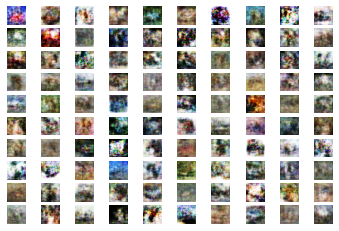

>saved: model_36707.h5
>36708, dr[0.677,0.547], df[0.682,0.609], g[0.717,0.359]
>36709, dr[0.699,0.469], df[0.683,0.578], g[0.713,0.453]
>36710, dr[0.675,0.547], df[0.722,0.500], g[0.738,0.438]
>36711, dr[0.722,0.391], df[0.701,0.547], g[0.704,0.469]
>36712, dr[0.688,0.516], df[0.698,0.562], g[0.732,0.266]
>36713, dr[0.642,0.625], df[0.707,0.531], g[0.705,0.453]
>36714, dr[0.702,0.469], df[0.694,0.578], g[0.711,0.406]
>36715, dr[0.710,0.500], df[0.690,0.516], g[0.716,0.391]
>36716, dr[0.690,0.531], df[0.684,0.672], g[0.690,0.562]
>36717, dr[0.667,0.609], df[0.728,0.453], g[0.726,0.469]
>36718, dr[0.679,0.500], df[0.699,0.531], g[0.705,0.469]
>36719, dr[0.687,0.516], df[0.713,0.438], g[0.712,0.406]
>36720, dr[0.697,0.469], df[0.693,0.516], g[0.703,0.453]
>36721, dr[0.694,0.516], df[0.695,0.484], g[0.728,0.438]
>36722, dr[0.687,0.578], df[0.693,0.594], g[0.697,0.500]
>36723, dr[0.696,0.547], df[0.673,0.547], g[0.739,0.391]
>36724, dr[0.696,0.531], df[0.703,0.422], g[0.743,0.344]
>36725, 

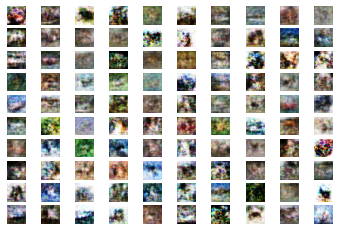

>saved: model_37488.h5
>37489, dr[0.670,0.531], df[0.696,0.578], g[0.741,0.344]
>37490, dr[0.698,0.469], df[0.693,0.531], g[0.725,0.359]
>37491, dr[0.667,0.562], df[0.732,0.422], g[0.715,0.406]
>37492, dr[0.678,0.438], df[0.706,0.516], g[0.746,0.297]
>37493, dr[0.676,0.547], df[0.686,0.625], g[0.692,0.484]
>37494, dr[0.667,0.594], df[0.711,0.500], g[0.717,0.516]
>37495, dr[0.697,0.469], df[0.729,0.438], g[0.711,0.391]
>37496, dr[0.693,0.438], df[0.718,0.500], g[0.744,0.297]
>37497, dr[0.723,0.422], df[0.678,0.625], g[0.745,0.328]
>37498, dr[0.698,0.438], df[0.701,0.531], g[0.710,0.438]
>37499, dr[0.675,0.531], df[0.714,0.547], g[0.704,0.438]
>37500, dr[0.697,0.484], df[0.724,0.516], g[0.696,0.484]
>37501, dr[0.701,0.422], df[0.683,0.562], g[0.731,0.422]
>37502, dr[0.690,0.500], df[0.685,0.547], g[0.713,0.391]
>37503, dr[0.708,0.422], df[0.711,0.500], g[0.704,0.562]
>37504, dr[0.708,0.500], df[0.694,0.531], g[0.704,0.484]
>37505, dr[0.684,0.469], df[0.686,0.500], g[0.735,0.391]
>37506, 

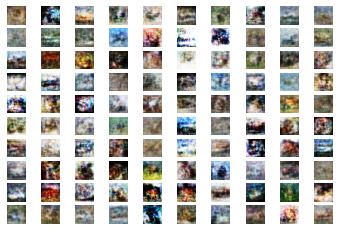

>saved: model_38269.h5
>38270, dr[0.683,0.484], df[0.723,0.500], g[0.692,0.516]
>38271, dr[0.684,0.516], df[0.712,0.500], g[0.720,0.422]
>38272, dr[0.669,0.547], df[0.696,0.500], g[0.733,0.375]
>38273, dr[0.673,0.453], df[0.703,0.547], g[0.702,0.484]
>38274, dr[0.680,0.484], df[0.703,0.578], g[0.721,0.422]
>38275, dr[0.666,0.656], df[0.726,0.453], g[0.693,0.516]
>38276, dr[0.717,0.453], df[0.703,0.547], g[0.693,0.578]
>38277, dr[0.674,0.578], df[0.693,0.609], g[0.733,0.375]
>38278, dr[0.678,0.562], df[0.709,0.531], g[0.716,0.391]
>38279, dr[0.694,0.484], df[0.747,0.484], g[0.702,0.453]
>38280, dr[0.698,0.422], df[0.705,0.516], g[0.697,0.531]
>38281, dr[0.710,0.453], df[0.689,0.531], g[0.705,0.469]
>38282, dr[0.699,0.391], df[0.707,0.547], g[0.701,0.438]
>38283, dr[0.685,0.531], df[0.700,0.516], g[0.721,0.422]
>38284, dr[0.731,0.391], df[0.688,0.516], g[0.710,0.359]
>38285, dr[0.700,0.438], df[0.664,0.688], g[0.724,0.391]
>38286, dr[0.697,0.531], df[0.668,0.719], g[0.728,0.375]
>38287, 

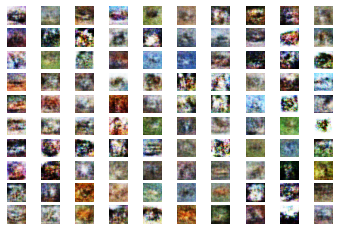

>saved: model_39050.h5
>39051, dr[0.733,0.344], df[0.670,0.531], g[0.763,0.344]
>39052, dr[0.700,0.469], df[0.650,0.703], g[0.747,0.344]
>39053, dr[0.684,0.516], df[0.675,0.656], g[0.750,0.328]
>39054, dr[0.683,0.578], df[0.680,0.719], g[0.714,0.438]
>39055, dr[0.702,0.547], df[0.674,0.656], g[0.756,0.344]
>39056, dr[0.678,0.500], df[0.726,0.516], g[0.744,0.359]
>39057, dr[0.719,0.422], df[0.701,0.531], g[0.721,0.500]
>39058, dr[0.732,0.391], df[0.699,0.484], g[0.733,0.312]
>39059, dr[0.682,0.516], df[0.717,0.422], g[0.709,0.469]
>39060, dr[0.697,0.484], df[0.699,0.516], g[0.696,0.516]
>39061, dr[0.712,0.469], df[0.688,0.625], g[0.700,0.500]
>39062, dr[0.706,0.484], df[0.682,0.609], g[0.748,0.328]
>39063, dr[0.717,0.344], df[0.687,0.547], g[0.733,0.375]
>39064, dr[0.701,0.516], df[0.698,0.562], g[0.746,0.359]
>39065, dr[0.696,0.484], df[0.654,0.688], g[0.773,0.188]
>39066, dr[0.694,0.469], df[0.666,0.688], g[0.746,0.328]
>39067, dr[0.719,0.406], df[0.671,0.719], g[0.762,0.281]
>39068, 

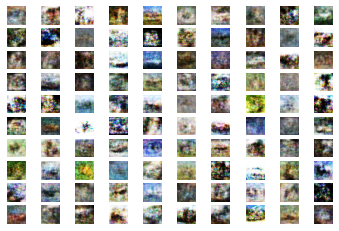

>saved: model_39831.h5
>39832, dr[0.713,0.406], df[0.661,0.688], g[0.696,0.531]
>39833, dr[0.715,0.453], df[0.684,0.625], g[0.732,0.328]
>39834, dr[0.691,0.547], df[0.686,0.547], g[0.749,0.266]
>39835, dr[0.713,0.375], df[0.682,0.641], g[0.750,0.344]
>39836, dr[0.705,0.453], df[0.697,0.609], g[0.734,0.328]
>39837, dr[0.670,0.562], df[0.707,0.547], g[0.727,0.375]
>39838, dr[0.699,0.484], df[0.702,0.578], g[0.729,0.312]
>39839, dr[0.697,0.547], df[0.704,0.609], g[0.719,0.406]
>39840, dr[0.706,0.438], df[0.679,0.594], g[0.705,0.406]
>39841, dr[0.703,0.562], df[0.674,0.562], g[0.738,0.359]
>39842, dr[0.676,0.516], df[0.663,0.688], g[0.745,0.281]
>39843, dr[0.663,0.594], df[0.698,0.656], g[0.734,0.406]
>39844, dr[0.688,0.422], df[0.699,0.516], g[0.719,0.406]
>39845, dr[0.718,0.422], df[0.682,0.594], g[0.707,0.438]
>39846, dr[0.744,0.344], df[0.691,0.625], g[0.718,0.406]
>39847, dr[0.685,0.531], df[0.687,0.578], g[0.712,0.406]
>39848, dr[0.693,0.484], df[0.695,0.547], g[0.700,0.500]
>39849, 

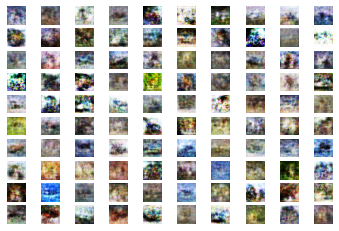

>saved: model_40612.h5
>40613, dr[0.696,0.484], df[0.686,0.594], g[0.706,0.453]
>40614, dr[0.689,0.500], df[0.660,0.672], g[0.744,0.266]
>40615, dr[0.694,0.562], df[0.709,0.500], g[0.724,0.422]
>40616, dr[0.713,0.469], df[0.676,0.516], g[0.723,0.406]
>40617, dr[0.710,0.453], df[0.708,0.453], g[0.712,0.406]
>40618, dr[0.703,0.453], df[0.748,0.391], g[0.721,0.328]
>40619, dr[0.694,0.531], df[0.697,0.547], g[0.700,0.438]
>40620, dr[0.680,0.500], df[0.677,0.672], g[0.743,0.328]
>40621, dr[0.681,0.594], df[0.697,0.469], g[0.739,0.359]
>40622, dr[0.684,0.500], df[0.742,0.422], g[0.737,0.344]
>40623, dr[0.697,0.516], df[0.699,0.547], g[0.738,0.375]
>40624, dr[0.679,0.531], df[0.679,0.656], g[0.724,0.438]
>40625, dr[0.707,0.453], df[0.702,0.484], g[0.739,0.375]
>40626, dr[0.701,0.469], df[0.652,0.656], g[0.750,0.328]
>40627, dr[0.697,0.469], df[0.673,0.594], g[0.748,0.344]
>40628, dr[0.715,0.438], df[0.694,0.484], g[0.713,0.484]
>40629, dr[0.725,0.422], df[0.670,0.625], g[0.751,0.297]
>40630, 

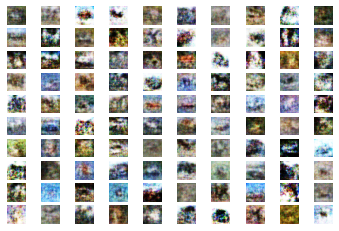

>saved: model_41393.h5
>41394, dr[0.703,0.453], df[0.693,0.562], g[0.711,0.422]
>41395, dr[0.708,0.422], df[0.689,0.609], g[0.757,0.344]
>41396, dr[0.706,0.562], df[0.701,0.578], g[0.723,0.344]
>41397, dr[0.667,0.578], df[0.688,0.578], g[0.737,0.328]
>41398, dr[0.684,0.422], df[0.655,0.672], g[0.753,0.312]
>41399, dr[0.683,0.500], df[0.647,0.672], g[0.745,0.375]
>41400, dr[0.692,0.453], df[0.727,0.531], g[0.760,0.281]
>41401, dr[0.675,0.547], df[0.659,0.672], g[0.726,0.391]
>41402, dr[0.682,0.594], df[0.680,0.641], g[0.779,0.312]
>41403, dr[0.677,0.578], df[0.659,0.656], g[0.705,0.500]
>41404, dr[0.660,0.562], df[0.671,0.547], g[0.751,0.375]
>41405, dr[0.715,0.406], df[0.699,0.562], g[0.742,0.359]
>41406, dr[0.650,0.578], df[0.694,0.500], g[0.743,0.312]
>41407, dr[0.711,0.500], df[0.718,0.562], g[0.763,0.297]
>41408, dr[0.692,0.438], df[0.686,0.562], g[0.755,0.359]
>41409, dr[0.686,0.562], df[0.671,0.625], g[0.718,0.344]
>41410, dr[0.694,0.531], df[0.696,0.547], g[0.728,0.359]
>41411, 

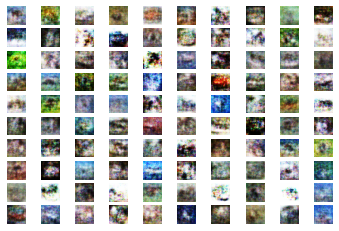

>saved: model_42174.h5
>42175, dr[0.697,0.516], df[0.667,0.562], g[0.731,0.406]
>42176, dr[0.718,0.375], df[0.664,0.625], g[0.734,0.328]
>42177, dr[0.695,0.438], df[0.708,0.547], g[0.750,0.359]
>42178, dr[0.716,0.422], df[0.693,0.547], g[0.744,0.344]
>42179, dr[0.691,0.484], df[0.685,0.578], g[0.702,0.484]
>42180, dr[0.690,0.453], df[0.723,0.594], g[0.710,0.484]
>42181, dr[0.705,0.438], df[0.691,0.609], g[0.744,0.328]
>42182, dr[0.701,0.438], df[0.718,0.484], g[0.737,0.359]
>42183, dr[0.709,0.438], df[0.698,0.562], g[0.706,0.453]
>42184, dr[0.722,0.422], df[0.703,0.453], g[0.716,0.422]
>42185, dr[0.726,0.391], df[0.703,0.500], g[0.721,0.375]
>42186, dr[0.686,0.500], df[0.703,0.547], g[0.752,0.281]
>42187, dr[0.709,0.469], df[0.685,0.562], g[0.713,0.406]
>42188, dr[0.698,0.422], df[0.687,0.578], g[0.751,0.266]
>42189, dr[0.690,0.453], df[0.686,0.609], g[0.746,0.281]
>42190, dr[0.711,0.516], df[0.663,0.641], g[0.695,0.453]
>42191, dr[0.687,0.531], df[0.714,0.531], g[0.738,0.406]
>42192, 

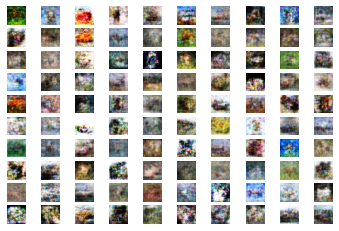

>saved: model_42955.h5
>42956, dr[0.690,0.500], df[0.652,0.703], g[0.747,0.328]
>42957, dr[0.668,0.531], df[0.667,0.672], g[0.750,0.344]
>42958, dr[0.717,0.344], df[0.712,0.578], g[0.769,0.281]
>42959, dr[0.687,0.406], df[0.667,0.641], g[0.695,0.359]
>42960, dr[0.660,0.578], df[0.694,0.625], g[0.769,0.219]
>42961, dr[0.696,0.453], df[0.679,0.578], g[0.714,0.406]
>42962, dr[0.699,0.484], df[0.692,0.547], g[0.698,0.547]
>42963, dr[0.701,0.484], df[0.739,0.500], g[0.709,0.453]
>42964, dr[0.700,0.422], df[0.674,0.609], g[0.741,0.359]
>42965, dr[0.708,0.438], df[0.681,0.562], g[0.760,0.297]
>42966, dr[0.707,0.375], df[0.682,0.625], g[0.701,0.359]
>42967, dr[0.704,0.500], df[0.748,0.531], g[0.782,0.250]
>42968, dr[0.721,0.328], df[0.680,0.625], g[0.706,0.359]
>42969, dr[0.732,0.422], df[0.722,0.516], g[0.709,0.344]
>42970, dr[0.707,0.484], df[0.692,0.547], g[0.720,0.344]
>42971, dr[0.662,0.547], df[0.665,0.656], g[0.746,0.344]
>42972, dr[0.702,0.453], df[0.670,0.625], g[0.722,0.469]
>42973, 

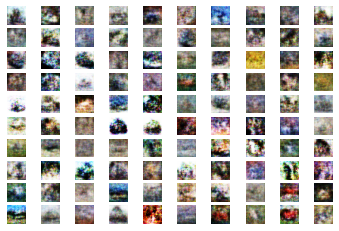

>saved: model_43736.h5
>43737, dr[0.679,0.469], df[0.689,0.562], g[0.708,0.406]
>43738, dr[0.713,0.469], df[0.688,0.641], g[0.743,0.344]
>43739, dr[0.727,0.422], df[0.686,0.438], g[0.737,0.344]
>43740, dr[0.716,0.422], df[0.696,0.625], g[0.747,0.406]
>43741, dr[0.703,0.469], df[0.695,0.500], g[0.701,0.547]
>43742, dr[0.730,0.359], df[0.669,0.641], g[0.724,0.391]
>43743, dr[0.726,0.359], df[0.680,0.578], g[0.742,0.312]
>43744, dr[0.706,0.406], df[0.710,0.516], g[0.751,0.297]
>43745, dr[0.727,0.406], df[0.635,0.797], g[0.744,0.281]
>43746, dr[0.737,0.359], df[0.684,0.625], g[0.751,0.328]
>43747, dr[0.739,0.328], df[0.658,0.703], g[0.739,0.281]
>43748, dr[0.683,0.578], df[0.694,0.562], g[0.734,0.375]
>43749, dr[0.697,0.531], df[0.668,0.641], g[0.736,0.312]
>43750, dr[0.684,0.531], df[0.682,0.547], g[0.743,0.312]
>43751, dr[0.727,0.422], df[0.673,0.547], g[0.744,0.297]
>43752, dr[0.695,0.531], df[0.664,0.656], g[0.728,0.297]
>43753, dr[0.728,0.406], df[0.677,0.609], g[0.747,0.266]
>43754, 

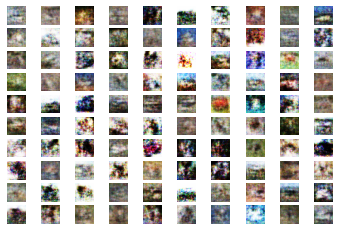

>saved: model_44517.h5
>44518, dr[0.694,0.500], df[0.693,0.562], g[0.739,0.312]
>44519, dr[0.668,0.594], df[0.698,0.531], g[0.740,0.359]
>44520, dr[0.664,0.500], df[0.706,0.547], g[0.725,0.406]
>44521, dr[0.677,0.469], df[0.671,0.562], g[0.740,0.406]
>44522, dr[0.675,0.547], df[0.713,0.562], g[0.727,0.422]
>44523, dr[0.712,0.453], df[0.684,0.625], g[0.743,0.406]
>44524, dr[0.679,0.516], df[0.665,0.656], g[0.741,0.344]
>44525, dr[0.671,0.547], df[0.676,0.609], g[0.749,0.344]
>44526, dr[0.689,0.547], df[0.718,0.469], g[0.678,0.609]
>44527, dr[0.699,0.438], df[0.732,0.484], g[0.734,0.344]
>44528, dr[0.650,0.578], df[0.729,0.547], g[0.719,0.422]
>44529, dr[0.674,0.547], df[0.732,0.484], g[0.708,0.453]
>44530, dr[0.669,0.625], df[0.726,0.500], g[0.724,0.406]
>44531, dr[0.663,0.547], df[0.713,0.547], g[0.707,0.484]
>44532, dr[0.673,0.562], df[0.691,0.531], g[0.704,0.422]
>44533, dr[0.673,0.562], df[0.696,0.531], g[0.703,0.484]
>44534, dr[0.715,0.438], df[0.701,0.562], g[0.766,0.281]
>44535, 

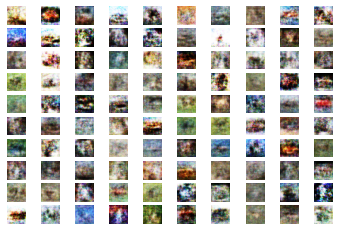

>saved: model_45298.h5
>45299, dr[0.660,0.609], df[0.716,0.453], g[0.720,0.453]
>45300, dr[0.661,0.609], df[0.706,0.422], g[0.736,0.359]
>45301, dr[0.667,0.609], df[0.679,0.531], g[0.717,0.422]
>45302, dr[0.671,0.609], df[0.719,0.531], g[0.742,0.391]
>45303, dr[0.728,0.344], df[0.663,0.656], g[0.749,0.266]
>45304, dr[0.670,0.562], df[0.675,0.672], g[0.705,0.438]
>45305, dr[0.697,0.469], df[0.723,0.406], g[0.724,0.375]
>45306, dr[0.700,0.453], df[0.681,0.578], g[0.738,0.312]
>45307, dr[0.698,0.516], df[0.680,0.578], g[0.735,0.438]
>45308, dr[0.718,0.422], df[0.673,0.594], g[0.717,0.422]
>45309, dr[0.684,0.516], df[0.674,0.641], g[0.723,0.391]
>45310, dr[0.675,0.500], df[0.722,0.562], g[0.738,0.375]
>45311, dr[0.704,0.453], df[0.647,0.719], g[0.741,0.312]
>45312, dr[0.687,0.484], df[0.677,0.625], g[0.724,0.422]
>45313, dr[0.677,0.547], df[0.683,0.531], g[0.744,0.375]
>45314, dr[0.678,0.547], df[0.679,0.594], g[0.765,0.328]
>45315, dr[0.722,0.344], df[0.682,0.500], g[0.720,0.469]
>45316, 

In [ ]:
# size of the latent space
latent_dim = 100
# train model
train(generator , discriminator , gan_model , X_train , latent_dim , n_epochs = 70 , n_batch = 64)